![title](images/PlantVillageLogoW.png)
# PlantVillage Disease Classification Challenge 
## [Crowd AI] 
https://www.aicrowd.com/challenges/plantvillage-disease-classification-challenge-old

## classification-of-plant-diseases ##

### Motivación y dataset ###


La motivación es crear un clasificador para enfermedades de plantas con herramientas de computer vision/ inteligencia artificial. Para entrenar el modelo se utilizará el dataset open source de PlantVillage (https://plantvillage.psu.edu/). PlantVillage es una plataforma, desarrollada en Penn State University que pone a disposición contenido libre sobre la salud de los cultivos. La idea de esta plataforma es democratizar el acceso a la información para la producción de alimentos en zonas carenciadas, principalmente en el continente Africano.

El dataset provisto por PlantVillage consta de 54303 imágenes de hojas sanas y no saludables divididas en 38 categorías por especie y enfermedad. El artículo original puede encontrarse en https://arxiv.org/pdf/1511.08060.pdf, realizado por David. P. Hughes, Marcel Salathe [1].

![Plant1](images/plant_1.png)![Plant2](images/plant_2.png)![Plant3](images/plant_3.png)


#### Modelos probados hasta ahora (En Orden de Aparicion) ####

* Modelos Unique Output
 * CNN Custom
 * VGG16
 * ResNet50
 * ResNet101V2
* Modelos Multi Output
 * Custom CNN
 * ResNet101V2


[1] An open access repository of images on plant health to enable the development of mobile disease diagnostics, David. P. Hughes and Marcel Salathe, 2016.


In [1]:
#Config GPU
%run "c:\tf\tf_config.py"

## Generating Directories Split Train / Validation / Test 

In [2]:
import os
root_dir = 'd:/Datasets/PlantLeaf'
source_dir = root_dir + "/Plants"
train_dir = root_dir + "/training"
val_dir = root_dir + "/validation"
test_dir = root_dir + "/testing"
os.makedirs(root_dir, exist_ok=True)

In [122]:
import os
import numpy as np
import shutil
import random
import pandas as pd

train = {}
validation = {}
test = {}
df_train = []
df_validation = []
df_test = []
counter = 0
val_ratio = 0.15
test_ratio = 0.05

def copy_files(Directory, Files):
    for name in Files:
        orig = source_dir + '/' + directory + '/' + name
        dest = Directory + '/' + directory + '/' + name
        try:
            shutil.copy(orig, dest)
        except:
            pass

def create_dict(root, files, diccionario):
    counter = len(diccionario)
    for name in files:
        name_split = directory.split('___') 
        plant_name = name_split[0]
        plant_health = ''
        if (len(name_split) > 1):
            plant_health = name_split[1].replace("_"," ")
        try: 
            diccionario[counter] = {"file": root + '/' +  name, "path": root, "health": plant_health, "type": plant_name}
        except: 
            print(root + '/' +  name)
        counter = counter + 1

print("Creating Directory Structure {}". format(root_dir))
categories = os.listdir(source_dir)
        
# Creating partitions of the data after shuffeling
for directory in (categories):
    if not os.path.exists(train_dir + '/' + directory): os.makedirs(train_dir + '/' + directory)
    if not os.path.exists(val_dir + '/' + directory): os.makedirs(val_dir + '/' + directory)
    if not os.path.exists(test_dir + '/' + directory): os.makedirs(test_dir + '/' + directory)
    allFileNames =  os.listdir(source_dir + "/" + directory + "/")
    np.random.shuffle(allFileNames)
    train_FileNames, val_FileNames, test_FileNames = np.split(np.array(allFileNames),
                                                              [int(len(allFileNames)* (1 - val_ratio + test_ratio)), 
                                                              int(len(allFileNames)* (1 - test_ratio))])
    
    # Copy-pasting images (Si las imagenes ya estan spliteadas comentar las siguientes lineas)
    print("Starting to copy Files on Directory at: {}:".format(directory))
    #copy_files(train_dir, train_FileNames)
    #copy_files(val_dir, val_FileNames)
    #copy_files(test_dir, test_FileNames)

# Creating Dictionaries of the information on the directories
for directory in (categories):
    train_FileNames =  os.listdir(train_dir + "/" + directory + "/")
    val_FileNames =  os.listdir(val_dir + "/" + directory + "/")
    test_FileNames =  os.listdir(test_dir + "/" + directory + "/")
    create_dict(train_dir +'/'+ directory, train_FileNames, train)
    create_dict(val_dir + '/' +directory, val_FileNames, validation)
    create_dict(test_dir + '/' +directory, test_FileNames, test)
    
df_train = pd.DataFrame.from_dict(train, "index")
df_validation = pd.DataFrame.from_dict(validation, "index")
df_test = pd.DataFrame.from_dict(test, "index")
display(df_train.shape)
display(df_validation.shape)
display(df_test.shape)

Creating Directory Structure d:/Datasets/PlantLeaf
Starting to copy Files on Directory at: Apple___Apple_scab:
Starting to copy Files on Directory at: Apple___Black_rot:
Starting to copy Files on Directory at: Apple___Cedar_apple_rust:
Starting to copy Files on Directory at: Apple___healthy:
Starting to copy Files on Directory at: Background_without_leaves:
Starting to copy Files on Directory at: Blueberry___healthy:
Starting to copy Files on Directory at: Cherry___healthy:
Starting to copy Files on Directory at: Cherry___Powdery_mildew:
Starting to copy Files on Directory at: Corn___Cercospora_leaf_spot Gray_leaf_spot:
Starting to copy Files on Directory at: Corn___Common_rust:
Starting to copy Files on Directory at: Corn___healthy:
Starting to copy Files on Directory at: Corn___Northern_Leaf_Blight:
Starting to copy Files on Directory at: Grape___Black_rot:
Starting to copy Files on Directory at: Grape___Esca_(Black_Measles):
Starting to copy Files on Directory at: Grape___healthy:
S

(49885, 4)

(2774, 4)

(2789, 4)

## Dataset Exploration

Random Images from train directory: 



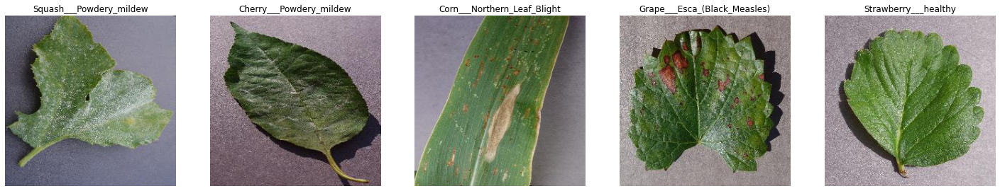

In [123]:
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.preprocessing import image

n=5
fig, axes = plt.subplots(1, n, figsize=(25,10))
print('Random Images from train directory: \n')

for i in range(n):
    category =  np.random.choice(categories)
    directory = [os.path.join(train_dir + '/' + category)]
    chosendir = np.random.choice(directory)
    plants =  os.listdir(chosendir)
    plant = chosendir + '/' + np.random.choice(plants)
    axes[i].set_title(category)
    axes[i].imshow(image.load_img(chosendir + '/' + np.random.choice(plants)))
    axes[i].axis('off')

[630, 621, 275, 1645, 1143, 1502, 854, 1052, 513, 1192, 1162, 985, 1180, 1383, 423, 1076, 5507, 2297, 360, 997, 1478, 1000, 152, 1000, 371, 5090, 1835, 456, 1109, 2127, 1000, 1591, 1909, 952, 1771, 1676, 1404, 373, 5357]


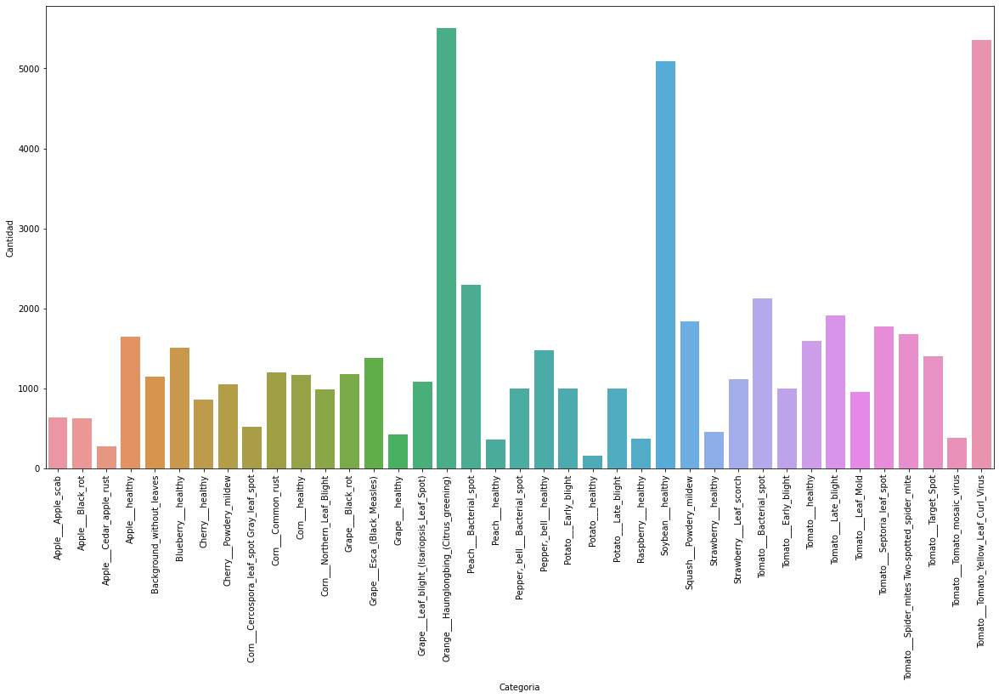

In [5]:
len(os.listdir((source_dir)))
source_dir
#[len(os.listdir('/'.join((source_dir,categories))))] 
number_of_pics_per_class = [len(os.listdir('/'.join((source_dir,plant_category)))) for plant_category in categories]
statistics = list(zip(categories, number_of_pics_per_class))

fig, ax = plt.subplots()
fig.set_size_inches(20, 10)
df = pd.DataFrame(statistics, columns=['Categoria', 'Cantidad'])

sns.barplot(data=df, x=df.Categoria, y=df.Cantidad)
ax.set_xticklabels(labels=df.Categoria, rotation=90)

print(number_of_pics_per_class)

<AxesSubplot:>

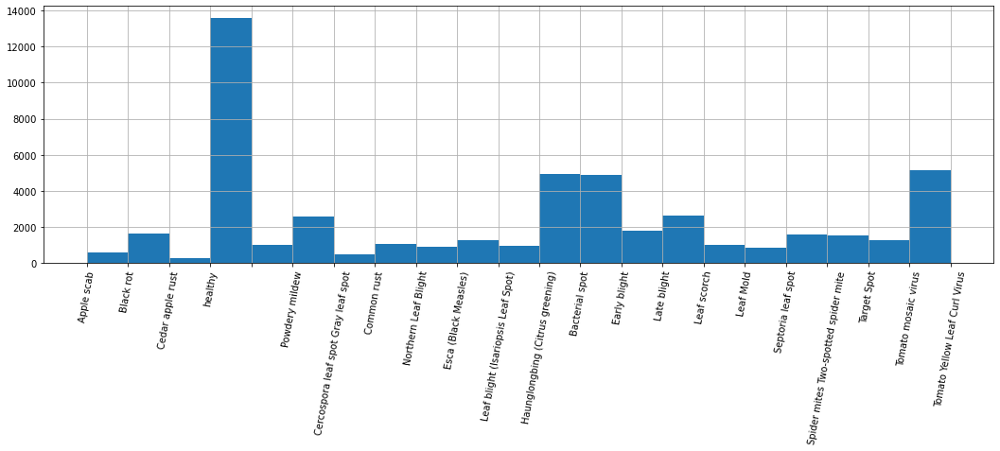

In [6]:
# Exploring Trainable Data: Deceases
df_train.health.hist(figsize=(18,5), xrot=80, bins=df_train.health.value_counts().shape[0] -1)

<AxesSubplot:>

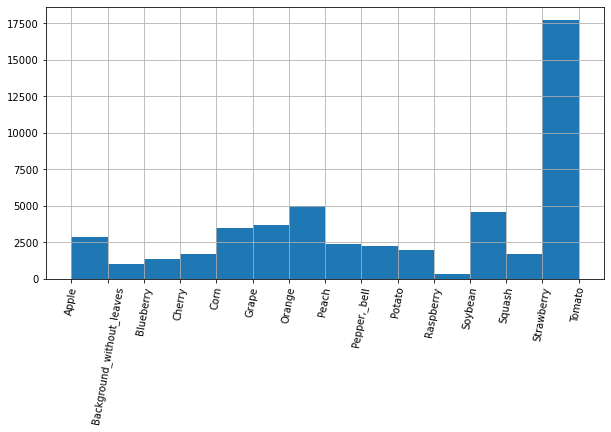

In [7]:
# Exploring Trainable Data: Types
df_train.type.hist(figsize=(10,5), xrot=80, bins=df_train.type.value_counts().shape[0] - 1)

In [8]:
df_train.health.value_counts()
# The Non Categorized are currently the "Backgroung Without Leaves"

healthy                                 13569
Haunglongbing (Citrus greening)          4956
Bacterial spot                           4878
Tomato Yellow Leaf Curl Virus            4821
Late blight                              2618
Powdery mildew                           2597
Early blight                             1800
Black rot                                1620
Septoria leaf spot                       1593
Spider mites Two-spotted spider mite     1508
Target Spot                              1263
Esca (Black Measles)                     1244
Common rust                              1072
                                         1028
Leaf scorch                               998
Leaf blight (Isariopsis Leaf Spot)        968
Northern Leaf Blight                      886
Leaf Mold                                 856
Apple scab                                567
Cercospora leaf spot Gray leaf spot       461
Tomato mosaic virus                       335
Cedar apple rust                  

## Data Augmentation

In [9]:
df_train

,file,path,health,type
0,d:/Datasets/PlantLeaf/training/Apple___Apple_s...,d:/Datasets/PlantLeaf/training/Apple___Apple_scab,Apple scab,Apple
1,d:/Datasets/PlantLeaf/training/Apple___Apple_s...,d:/Datasets/PlantLeaf/training/Apple___Apple_scab,Apple scab,Apple
2,d:/Datasets/PlantLeaf/training/Apple___Apple_s...,d:/Datasets/PlantLeaf/training/Apple___Apple_scab,Apple scab,Apple
3,d:/Datasets/PlantLeaf/training/Apple___Apple_s...,d:/Datasets/PlantLeaf/training/Apple___Apple_scab,Apple scab,Apple
4,d:/Datasets/PlantLeaf/training/Apple___Apple_s...,d:/Datasets/PlantLeaf/training/Apple___Apple_scab,Apple scab,Apple
...,...,...,...,...
49880,d:/Datasets/PlantLeaf/training/Tomato___Tomato...,d:/Datasets/PlantLeaf/training/Tomato___Tomato...,Tomato Yellow Leaf Curl Virus,Tomato
49881,d:/Datasets/PlantLeaf/training/Tomato___Tomato...,d:/Datasets/PlantLeaf/training/Tomato___Tomato...,Tomato Yellow Leaf Curl Virus,Tomato
49882,d:/Datasets/PlantLeaf/training/Tomato___Tomato...,d:/Datasets/PlantLeaf/training/Tomato___Tomato...,Tomato Yellow Leaf Curl Virus,Tomato
49883,d:/Datasets/PlantLeaf/training/Tomato___Tomato...,d:/Datasets/PlantLeaf/training/Tomato___Tomato...,Tomato Yellow Leaf Curl Virus,Tomato


In [10]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Definimos un generador de imágenes aumentadas
train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

# ¡Notar que la data de validación no debe ser aumentada!
val_datagen = ImageDataGenerator(rescale=1./255)

#####################################################################################
##########################  GENERATOR SIMPLE OUTPUT #################################
#####################################################################################

train_generator = train_datagen.flow_from_directory(
        train_dir,                      # Directorio target
        target_size=(150, 150),         # Reescalamos a 150x150
        batch_size=20,                 
        class_mode='categorical')       # Usamos categorical 

validation_generator = val_datagen.flow_from_directory(
        val_dir,                        # Directorio target
        target_size=(150, 150),         # Reescalamos a 150x150
        batch_size=20,
        shuffle=False,
        class_mode='categorical')        # Usamos categorical

#####################################################################################
########################## GENERATOR MULTI OUTPUT ###################################
#####################################################################################
data_dir = ""

train_generator_mo = train_datagen.flow_from_dataframe(
    df_train,                         # Referimos el df de train
    directory=data_dir,                # El directorio donde se encuentran las imágenes
    x_col='file',                      # La columna con los path de los archivos
    y_col=['health', 'type'],          # La variable con las labels
    target_size=(150, 150),
    classes=None,                      # Las clases se obtienen a partir de y_col
    class_mode='multi_output',         # Se trata de un problema multi-output, multi-label
    batch_size=32
   )

val_generator_mo = val_datagen.flow_from_dataframe(
    df_validation,                           # Referimos el df de validación
    directory=data_dir,                      # El directorio donde se encuentran las imágenes
    x_col='file',                            # La columna con los path de los archivos
    y_col=['health', 'type'],                # La variable con las labels
    target_size=(150, 150),
    classes=None,                            # Las clases se obtienen a partir de y_col
    class_mode='multi_output',               # Se trata de un problema multi-output, multi-label
    batch_size=32,
    shuffle=False
   )

Found 49885 images belonging to 39 classes.
Found 2774 images belonging to 39 classes.
Found 49885 validated image filenames.
Found 2774 validated image filenames.


In [11]:
from sklearn.utils import compute_class_weight
classWeight = compute_class_weight('balanced', np.unique(train_generator.classes), train_generator.classes) 
classWeight = dict(enumerate(classWeight))

C:\Users\alexi\.conda\envs\tf\lib\site-packages\sklearn\utils\validation.py:70: FutureWarning: Pass classes=[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38], y=[ 0  0  0 ... 38 38 38] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


Augmentated(?) Image (testing train datagen :P)  :


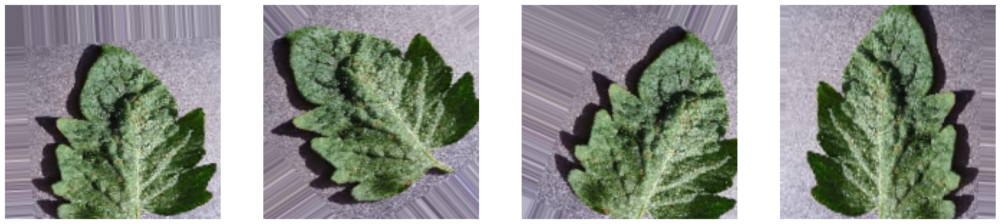

In [12]:
# Elegimos una imagen para "aumentar"
img_path = plant

# La leemos y la reescalamos
img = image.load_img(plant, target_size=(150, 150))

# La convertimos a un Numpy de forma (150, 150, 3)
x = image.img_to_array(img)

# La reescalamos a (1, 150, 150, 3)
x = x.reshape((1,) + x.shape)

# El comando .flow() genera batches de imágenes transformadas aleatoriamente
# Usamos un `break` para cortar el loop en algún momento
i = 0
n=4
fig, axes = plt.subplots(1, n, figsize=(25,10))

print("Augmentated(?) Image (testing train datagen :P)  :")
for batch in train_datagen.flow(x, batch_size=1):
    axes[i].imshow(image.array_to_img(batch[0]))
    axes[i].axis('off')
    i += 1
    if i % 4 == 0:
        break

## Graphics

In [13]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import numpy as np

In [14]:
def plotear(history,acc,val_acc,loss,val_loss):
    acc = history.history[acc]
    val_acc = history.history[val_acc]
    loss = history.history[loss]
    val_loss = history.history[val_loss]
    epochs = range(1, len(acc) + 1)
    
    fig, axes = plt.subplots(1, 2, figsize=(25,10))
    
    axes[0].set_title('Training and validation accuracy')
    axes[0].plot(epochs, acc, label='Training accuracy')
    axes[0].plot(epochs, val_acc, label='Validation accuracy')
    axes[0].set_xticks(ticks=epochs)
    axes[0].legend()
    
    axes[1].set_title('Training and validation loss')
    axes[1].plot(epochs, loss, label='Training loss')
    axes[1].plot(epochs, val_loss, label='Validation loss')
    axes[1].set_xticks(ticks=epochs)
    axes[1].legend()

In [15]:
def predict_images(model, n):
    fig, axes = plt.subplots(1, n, figsize=(25,10))

    for i in range(n):
        category = np.random.choice(categories)
        directory = [os.path.join(val_dir + '/' + category)]
        chosendir = np.random.choice(directory)
        plants =  os.listdir(chosendir)
        plant = chosendir + '/' + np.random.choice(plants)

        # Imagen original
        val_image = image.load_img(plant, target_size=(150, 150))

        # Preprocesamiento
        val_image = image.img_to_array(val_image)
        val_image /= 255.
        val_image = np.expand_dims(val_image, axis=0)

        # Predicción
        prediction = model.predict(val_image)
        prediction_probability = np.amax(prediction)
        predicted_label = int(prediction_probability > 0.5)

        #indices where max values are located
        max_indices = np.argwhere( prediction == np.amax(prediction))

        #get max positions
        max_positions = [p for p in max_indices.flatten().tolist()]

        #first max value
        predicted_label = max_positions[1]

        # Etiquetas
        labels = validation_generator.class_indices
        labels = dict((v,k) for k,v in labels.items())
        
        category_splitted = category.split("___",2)
        Species = category_splitted[0]
        if (len(category_splitted) > 1): 
            Subtype = category_splitted[1] 
        else:Subtype="" 

        predicted_splitted = labels[predicted_label].split("___",2)
        Species_pred = predicted_splitted[0]
        if (len(predicted_splitted) > 1): 
            Subtype_pred = predicted_splitted[1] 
        else:Subtype_pred="" 
            
        # Visualizamos la imagen y su predicción
        title = "Especie Real = {}\nEspecie Pred = {}\nCategoria Real = {}\nCategoria Pred = {}\nProbabilidad = {:.2f} %\n" \
                    .format(Species,Species_pred, Subtype, Subtype_pred,
                            prediction_probability*100 if prediction_probability>0.5 else (1-prediction_probability)*100)

        axes[i].imshow(plt.imread(plant))
        axes[i].set_title(title)
        axes[i].axis('off')

In [16]:
def confusion_matrix_plot(model):
    
    test_datagen = ImageDataGenerator(rescale=1./255)

    test_generator = test_datagen.flow_from_directory(
            test_dir,
            target_size=(150, 150),
            batch_size=20,
            class_mode='categorical',
            shuffle=False)

    labels = validation_generator.class_indices
    labels = dict((v,k) for k,v in labels.items())
    tick_labels = list(labels.values())
    test_loss, test_acc = model.evaluate_generator(test_generator, steps=50)
    print('Accuracy en test:', np.round(test_acc, 2))

    Y_pred = model.predict_generator(test_generator)
    y_pred = np.argmax(Y_pred, axis=1)
    print('Confusion Matrix:')
    cm = confusion_matrix(test_generator.classes, y_pred)

    plt.figure(figsize=(15,15))
    sns.heatmap(cm, annot=True, fmt='.0f', square=True,
                 xticklabels=tick_labels, yticklabels=tick_labels,
                 cbar=False)
    plt.ylabel('Etiqueta real')
    plt.xlabel('Etiqueta predicha')
    plt.title('Confusion Matrix')
    plt.show()

# MODELOS DE CNN #

Se explorarán diferentes modelos para verificar cuales son los mejores resultados: 

<img src="images/Models.jpg" alt="Drawing" style="width: 800px;"/> 

## MODELOS SIMPLE OUTPUT ##

### Probando con Modelo desde cero [CNN y Capas] ###

In [17]:
from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras import optimizers

In [19]:
custom_model = models.Sequential()
custom_model.add(layers.Conv2D(32, (3, 3), activation='relu',
                        input_shape=(150, 150, 3)))
custom_model.add(layers.MaxPooling2D((2, 2)))

custom_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
custom_model.add(layers.MaxPooling2D((2, 2)))

custom_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
custom_model.add(layers.MaxPooling2D((2, 2)))

custom_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
custom_model.add(layers.MaxPooling2D((2, 2)))

custom_model.add(layers.Flatten())
custom_model.add(layers.Dense(512, activation='relu'))
custom_model.add(layers.Dense(39, activation='softmax'))

In [20]:
custom_model.compile(loss='binary_crossentropy',
              optimizer=optimizers.Adam(),
              metrics=['acc'])

In [21]:
custom_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 17, 17, 128)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 15, 15, 128)       1

In [22]:
history = custom_model.fit(
      train_generator,
      steps_per_epoch=100,
      epochs=30,
      validation_data=validation_generator,
      validation_steps=50,
      class_weight=classWeight,
      verbose=1)

Epoch 1/30
100/100 [==============================] - 25s 248ms/step - loss: 0.1178 - acc: 0.0210 - val_loss: 0.1191 - val_acc: 0.0010
Epoch 2/30
100/100 [==============================] - 20s 198ms/step - loss: 0.1205 - acc: 0.0220 - val_loss: 0.1135 - val_acc: 0.0690
Epoch 3/30
100/100 [==============================] - 19s 192ms/step - loss: 0.1134 - acc: 0.0380 - val_loss: 0.1116 - val_acc: 0.0620
Epoch 4/30
100/100 [==============================] - 19s 186ms/step - loss: 0.1182 - acc: 0.0398 - val_loss: 0.1105 - val_acc: 0.1070
Epoch 5/30
100/100 [==============================] - 19s 186ms/step - loss: 0.1152 - acc: 0.0620 - val_loss: 0.1078 - val_acc: 0.1070
Epoch 6/30
100/100 [==============================] - 18s 183ms/step - loss: 0.1070 - acc: 0.0735 - val_loss: 0.1045 - val_acc: 0.1180
Epoch 7/30
100/100 [==============================] - 18s 180ms/step - loss: 0.1090 - acc: 0.0970 - val_loss: 0.0994 - val_acc: 0.1780
Epoch 8/30
100/100 [==============================] - 1

In [25]:
custom_model.save('./models/plant_decease_custom_cnn.h5')

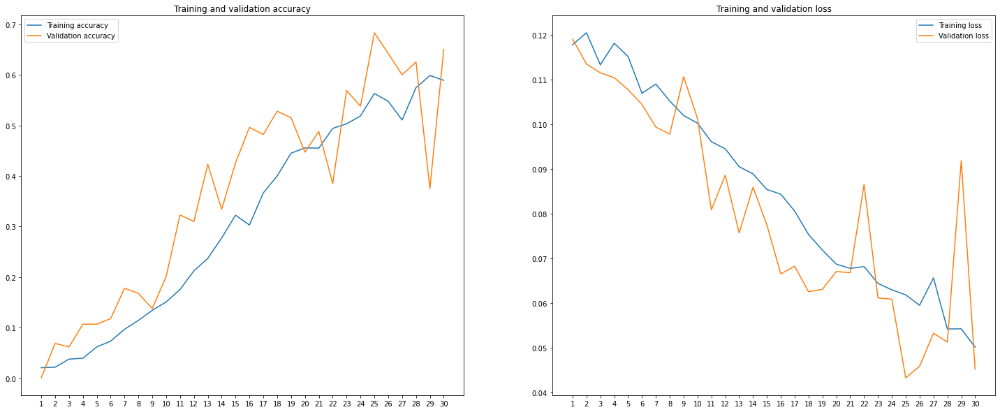

In [23]:
plotear(history,'acc','val_acc','loss','val_loss')

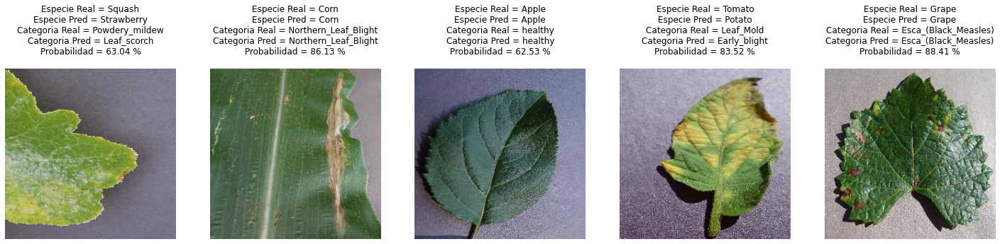

In [24]:
predict_images(custom_model, 5)

### Probando con VGG16 ###

![title](images/vgg16.png)

VGG16 is a convolutional neural network model proposed by K. Simonyan and A. Zisserman from the University of Oxford in the paper “Very Deep Convolutional Networks for Large-Scale Image Recognition”. The model achieves 92.7% top-5 test accuracy in ImageNet, which is a dataset of over 14 million images belonging to 1000 classes. It was one of the famous model submitted to ILSVRC-2014. It makes the improvement over AlexNet by replacing large kernel-sized filters (11 and 5 in the first and second convolutional layer, respectively) with multiple 3×3 kernel-sized filters one after another. VGG16 was trained for weeks and was using NVIDIA Titan Black GPU’s.

![title](images/vgg16_layers.png)


In [26]:
from tensorflow.keras.applications import VGG16

conv_base = VGG16(weights='imagenet',
                  include_top=False,
                  input_shape=(150, 150, 3))

In [27]:
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 150, 150, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 150, 150, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 150, 150, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 75, 75, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 75, 75, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 75, 75, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 37, 37, 128)       0     

In [28]:
model_vgg16 = models.Sequential()
model_vgg16.add(conv_base)
model_vgg16.add(layers.Flatten())
model_vgg16.add(layers.Dense(256, activation='relu'))
model_vgg16.add(layers.Dense(39, activation='softmax'))

In [29]:
model_vgg16.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 4, 4, 512)         14714688  
_________________________________________________________________
flatten_1 (Flatten)          (None, 8192)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 256)               2097408   
_________________________________________________________________
dense_3 (Dense)              (None, 39)                10023     
Total params: 16,822,119
Trainable params: 16,822,119
Non-trainable params: 0
_________________________________________________________________


In [30]:
print('Este es el número de tensores de pesos entrenables antes de freezar la base convolucional:', len(model_vgg16.trainable_weights))
conv_base.trainable = False
print('Este es el número de tensores de pesos entrenables después de freezar la base convolucional:', len(model_vgg16.trainable_weights))

Este es el número de tensores de pesos entrenables antes de freezar la base convolucional: 30
Este es el número de tensores de pesos entrenables después de freezar la base convolucional: 4


In [31]:
model_vgg16.compile(loss='binary_crossentropy',
              optimizer=optimizers.Adam(),
              metrics=['acc'])

In [32]:
history_vgg16 = model_vgg16.fit(
      train_generator,
      steps_per_epoch=100,
      epochs=30,
      validation_data=validation_generator,
      validation_steps=50,
      class_weight=classWeight,
      verbose=1)

Epoch 1/30
100/100 [==============================] - 15s 146ms/step - loss: 0.1036 - acc: 0.2410 - val_loss: 0.0560 - val_acc: 0.6250
Epoch 2/30
100/100 [==============================] - 14s 145ms/step - loss: 0.0735 - acc: 0.4550 - val_loss: 0.0467 - val_acc: 0.6130
Epoch 3/30
100/100 [==============================] - 15s 146ms/step - loss: 0.0648 - acc: 0.5015 - val_loss: 0.0283 - val_acc: 0.7980
Epoch 4/30
100/100 [==============================] - 14s 145ms/step - loss: 0.0553 - acc: 0.5640 - val_loss: 0.0316 - val_acc: 0.7470
Epoch 5/30
100/100 [==============================] - 15s 147ms/step - loss: 0.0550 - acc: 0.5855 - val_loss: 0.0255 - val_acc: 0.8140
Epoch 6/30
100/100 [==============================] - 14s 144ms/step - loss: 0.0501 - acc: 0.6065 - val_loss: 0.0254 - val_acc: 0.8050
Epoch 7/30
100/100 [==============================] - 14s 143ms/step - loss: 0.0446 - acc: 0.6385 - val_loss: 0.0221 - val_acc: 0.8300
Epoch 8/30
100/100 [==============================] - 1

In [41]:
custom_model.save('./models/plant_decease_vgg16.h5')

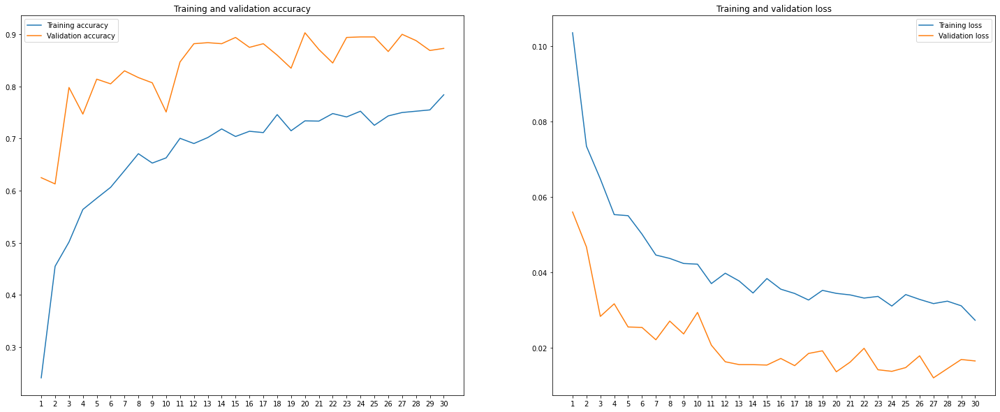

In [42]:
plotear(history_vgg16,'acc','val_acc','loss','val_loss')

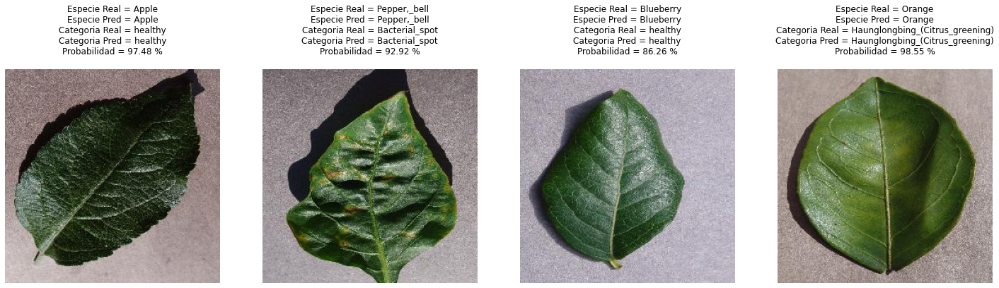

In [43]:
predict_images(model_vgg16, 4)

### Probando con RESNET50 ###

ResNet-50 is a convolutional neural network that is 50 layers deep. You can load a pretrained version of the network trained on more than a million images from the ImageNet database [1]. The pretrained network can classify images into 1000 object categories, such as keyboard, mouse, pencil, and many animals. As a result, the network has learned rich feature representations for a wide range of images. The network has an image input size of 224-by-224.

<img src="images/Resnets.png" alt="Drawing" style="width: 1200px;"/> 

In [22]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import datetime

In [32]:
def define_callbacks(ModelName, monitor='val_loss', verbose=1, patience=8, min_delta=0.01, restore_best_weights=True):    
    early_stopping_callback = EarlyStopping(monitor=monitor, patience=patience, min_delta=min_delta ,restore_best_weights=restore_best_weights,verbose=verbose)
    checkpoint_callback = ModelCheckpoint('./checkpoints/checkpoint_callback_'+ ModelName +'.h5', monitor=monitor, verbose=verbose, save_best_only=restore_best_weights,mode='min')
    log_dir = "logs/fit/"+ ModelName + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1,profile_batch=0)
    print("Model Callbacks on Model {}, are the following:" .format(ModelName))
    print("····················································")
    print("EarlyStoppingCallback: Monitor: {}, Verbose: {}, Patience: {}, MinDelta: {}, RestoreWeights: {}" .format(early_stopping_callback.monitor,early_stopping_callback.verbose, early_stopping_callback.patience, early_stopping_callback.min_delta, early_stopping_callback.restore_best_weights))
    print("ModelCheckpoint: Monitor: {}, Verbose: {}, SaveBestOnly: {}" .format(checkpoint_callback.monitor,checkpoint_callback.verbose,checkpoint_callback.save_best_only))
    print("TensorBoard: Log Dir: {}, histogram_freq: {}" .format(tensorboard_callback.log_dir,tensorboard_callback.histogram_freq))
    return [early_stopping_callback, checkpoint_callback, tensorboard_callback]

In [27]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Input, ZeroPadding2D, Conv2D, BatchNormalization, Activation, MaxPooling2D, GlobalAveragePooling2D, Add, Dense
from tensorflow.keras.models import Model

In [28]:
x_input = Input((150, 150, 3))

resnet50_pretrained = ResNet50(
    include_top=False,
    pooling='avg',
    input_shape=((150, 150, 3)),
)

resnet50_pretrained.trainable = False

In [29]:
x = resnet50_pretrained(x_input)

In [30]:
#x = Dense(512, activation='relu', name='layer_512')(x)
x = Dense(256, activation='relu', name='layer_256')(x)
x = Dense(39, activation='softmax', name='layer_39')(x)

resnet50_pretrained = Model(inputs=x_input, outputs=x, name='ResNet50')

resnet50_pretrained.summary()

Model: "ResNet50"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 150, 150, 3)]     0         
_________________________________________________________________
resnet50 (Functional)        (None, 2048)              23587712  
_________________________________________________________________
layer_256 (Dense)            (None, 256)               524544    
_________________________________________________________________
layer_39 (Dense)             (None, 39)                10023     
Total params: 24,122,279
Trainable params: 534,567
Non-trainable params: 23,587,712
_________________________________________________________________


In [33]:
from tensorflow.keras import optimizers

resnet50_pretrained.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])

custom_callbacks = [define_callbacks(resnet50_pretrained.name)]

history_resnet50 = resnet50_pretrained.fit(train_generator,
                       steps_per_epoch=44000//32,
                       epochs=100,
                       validation_data=validation_generator,
                       validation_steps=4400//32,
                       class_weight=classWeight,
                       callbacks=custom_callbacks)

Model Callbacks on Model ResNet50, are the following:
····················································
EarlyStoppingCallback: Monitor: val_loss, Verbose: 1, Patience: 8, MinDelta: -0.01, RestoreWeights: True
ModelCheckpoint: Monitor: val_loss, Verbose: 1, SaveBestOnly: True
TensorBoard: Log Dir: logs/fit/ResNet5020201130-091238, histogram_freq: 1
Epoch 1/100
1375/1375 [==============================] - ETA: 0s - loss: 3.6425 - acc: 0.0264
Epoch 00001: val_loss improved from inf to 3.58183, saving model to ./checkpoints\checkpoint_callback_ResNet50.h5
1375/1375 [==============================] - 344s 250ms/step - loss: 3.6425 - acc: 0.0264 - val_loss: 3.5818 - val_acc: 0.0547
Epoch 2/100
1375/1375 [==============================] - ETA: 0s - loss: 3.6241 - acc: 0.0457
Epoch 00002: val_loss improved from 3.58183 to 3.56181, saving model to ./checkpoints\checkpoint_callback_ResNet50.h5
1375/1375 [==============================] - 282s 205ms/step - loss: 3.6241 - acc: 0.0457 - val_loss

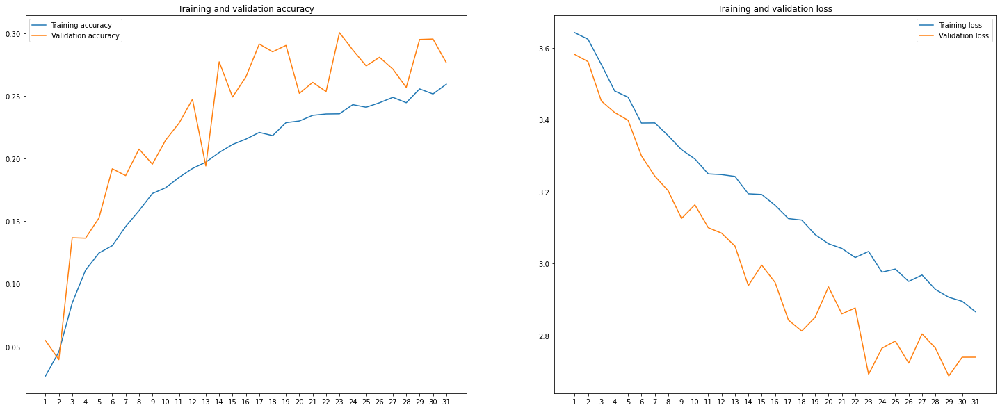

In [34]:
plotear(history_resnet50,'acc','val_acc','loss','val_loss')

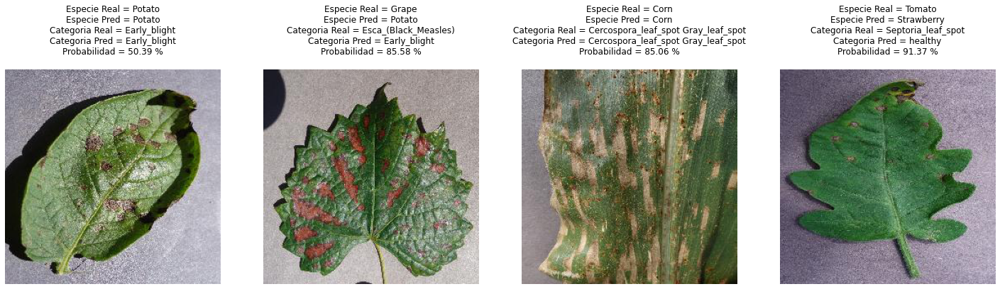

In [35]:
predict_images(resnet50_pretrained, 4)

Found 2789 images belonging to 39 classes.
Instructions for updating:
Please use Model.evaluate, which supports generators.
Accuracy en test: 0.28
Instructions for updating:
Please use Model.predict, which supports generators.
Confusion Matrix:


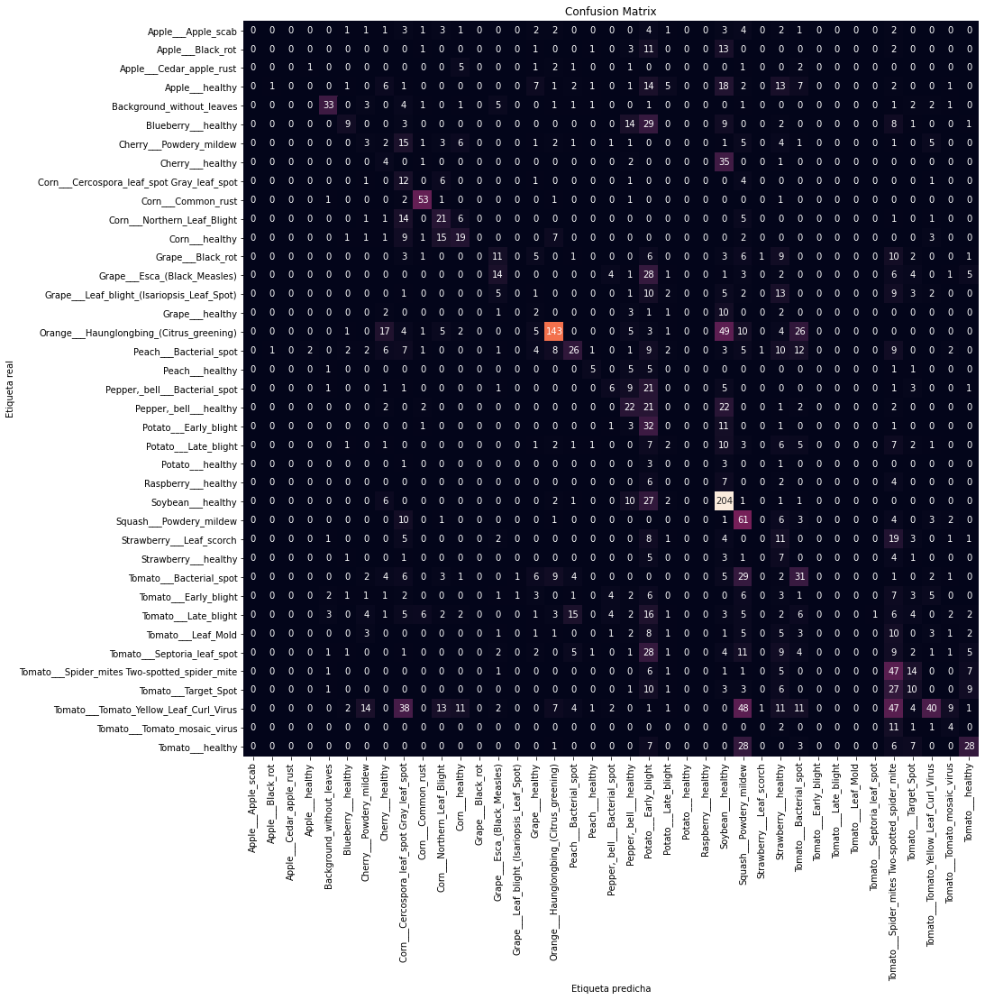

In [36]:
confusion_matrix_plot(resnet50_pretrained)

### Resnet 101 v2 ###

The primary difference between ResNetV2 and the original (V1) is that V2 uses batch normalization before each weight layer.

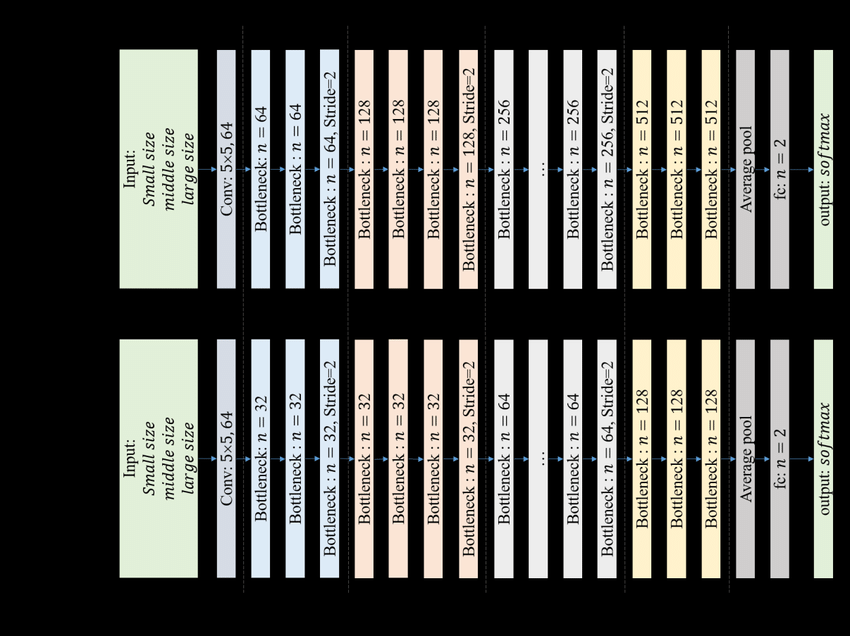

In [37]:
from tensorflow.keras.applications import ResNet101V2

In [38]:
resnet101_pretrained = ResNet101V2(
    include_top=False,
    pooling='avg',
    input_shape=((150, 150, 3)),
)

resnet101_pretrained.trainable = False


In [39]:
x = resnet101_pretrained(x_input)
x = Dense(512, activation='relu', name='layer2_512')(x)
x = Dense(39, activation='softmax', name='layer3_39')(x)

resnet101_pretrained = Model(inputs=x_input, outputs=x, name='ResNet101')

resnet101_pretrained.summary()

Model: "ResNet101"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 150, 150, 3)]     0         
_________________________________________________________________
resnet101v2 (Functional)     (None, 2048)              42626560  
_________________________________________________________________
layer2_512 (Dense)           (None, 512)               1049088   
_________________________________________________________________
layer3_39 (Dense)            (None, 39)                20007     
Total params: 43,695,655
Trainable params: 1,069,095
Non-trainable params: 42,626,560
_________________________________________________________________


In [40]:
from tensorflow.keras import optimizers
tf.keras.backend.clear_session()

resnet101_pretrained.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(lr=1e-4),
              metrics=['acc'])

custom_callbacks = define_callbacks(resnet101_pretrained.name)

Model Callbacks on Model ResNet101, are the following:
····················································
EarlyStoppingCallback: Monitor: val_loss, Verbose: 1, Patience: 8, MinDelta: -0.01, RestoreWeights: True
ModelCheckpoint: Monitor: val_loss, Verbose: 1, SaveBestOnly: True
TensorBoard: Log Dir: logs/fit/ResNet10120201130-113147, histogram_freq: 1


In [41]:
history_resnet101 = resnet101_pretrained.fit(train_generator,
                       steps_per_epoch=44000//32,
                       epochs=100,
                       validation_data=validation_generator,
                       validation_steps=4400//32,
                       class_weight=classWeight,
                       callbacks=custom_callbacks)

Epoch 1/100
1375/1375 [==============================] - ETA: 0s - loss: 1.3039 - acc: 0.6532
Epoch 00001: val_loss improved from inf to 0.67097, saving model to ./checkpoints\checkpoint_callback_ResNet101.h5
1375/1375 [==============================] - 166s 121ms/step - loss: 1.3039 - acc: 0.6532 - val_loss: 0.6710 - val_acc: 0.8040
Epoch 2/100
1375/1375 [==============================] - ETA: 0s - loss: 0.6410 - acc: 0.8090
Epoch 00002: val_loss improved from 0.67097 to 0.52072, saving model to ./checkpoints\checkpoint_callback_ResNet101.h5
1375/1375 [==============================] - 163s 118ms/step - loss: 0.6410 - acc: 0.8090 - val_loss: 0.5207 - val_acc: 0.8325
Epoch 3/100
1375/1375 [==============================] - ETA: 0s - loss: 0.5349 - acc: 0.8356
Epoch 00003: val_loss improved from 0.52072 to 0.46379, saving model to ./checkpoints\checkpoint_callback_ResNet101.h5
1375/1375 [==============================] - 164s 119ms/step - loss: 0.5349 - acc: 0.8356 - val_loss: 0.4638 - 

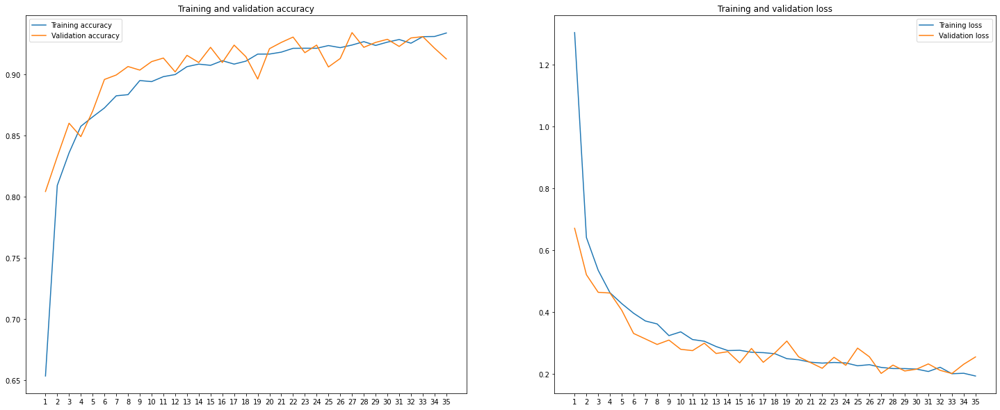

In [42]:
plotear(history_resnet101,'acc','val_acc','loss','val_loss')

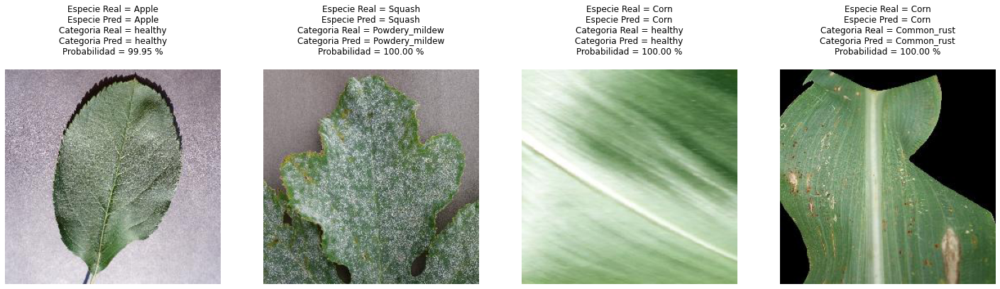

In [45]:
predict_images(resnet101_pretrained, 4)

Found 2789 images belonging to 39 classes.
Accuracy en test: 0.96
Confusion Matrix:


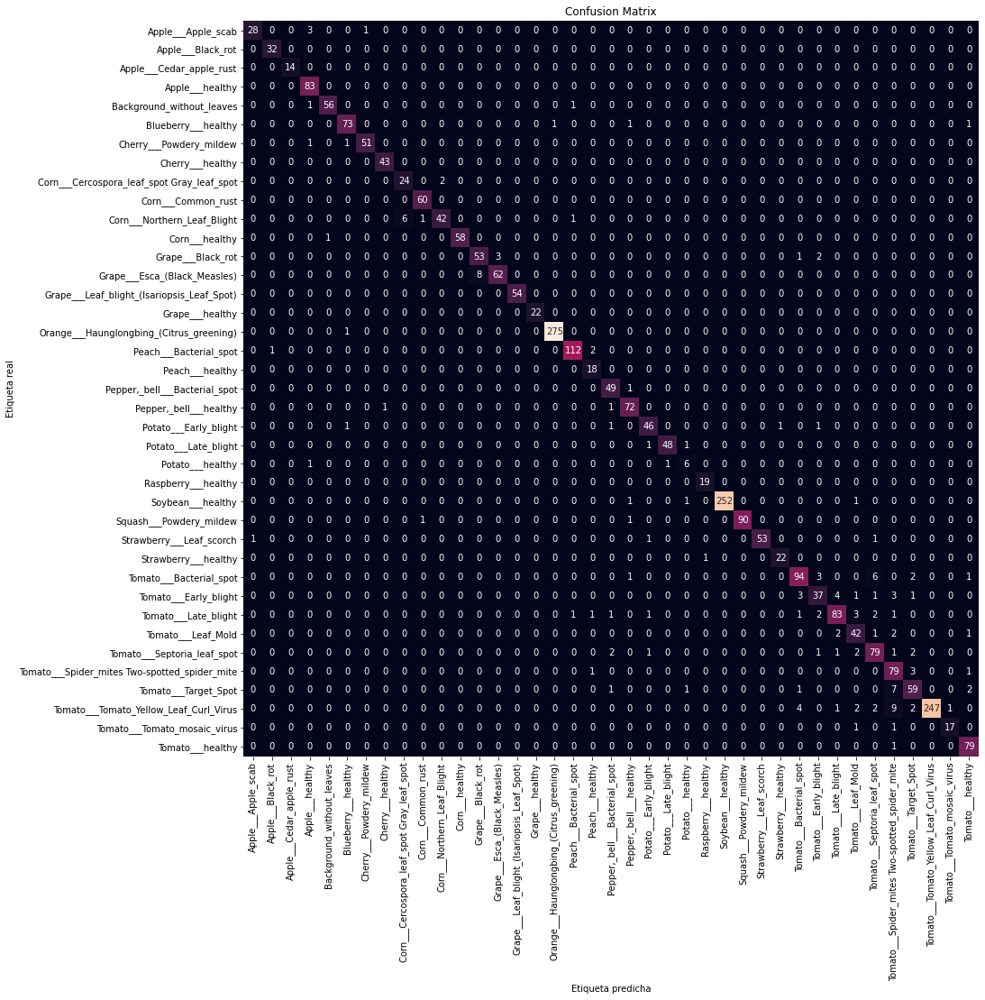

In [46]:
confusion_matrix_plot(resnet101_pretrained)

## MODELOS DOBLE OUTPUT ##

In [47]:
#Testeamos nuestro generador
x, y = train_generator_mo.next()
print('x shape: ',x.shape)
print('y1 shape: ',y[0].shape)
print('y2 shape: ',y[1].shape)
print('y1: ',y[0])
print('y2: ',y[1])

x shape:  (32, 150, 150, 3)
y1 shape:  (32,)
y2 shape:  (32,)
y1:  ['healthy' 'healthy' 'Haunglongbing (Citrus greening)'
 'Haunglongbing (Citrus greening)' 'Haunglongbing (Citrus greening)'
 'Late blight' 'Esca (Black Measles)' 'healthy' 'healthy' 'Leaf Mold'
 'healthy' 'Leaf scorch' '' 'Tomato Yellow Leaf Curl Virus'
 'Tomato Yellow Leaf Curl Virus' 'healthy' 'Septoria leaf spot' 'healthy'
 'Bacterial spot' 'healthy' 'healthy' 'Haunglongbing (Citrus greening)'
 'Haunglongbing (Citrus greening)' 'Black rot' '' 'healthy' 'Target Spot'
 'healthy' 'healthy' 'healthy' 'Haunglongbing (Citrus greening)'
 'Haunglongbing (Citrus greening)']
y2:  ['Pepper,_bell' 'Cherry' 'Orange' 'Orange' 'Orange' 'Tomato' 'Grape'
 'Blueberry' 'Blueberry' 'Tomato' 'Soybean' 'Strawberry'
 'Background_without_leaves' 'Tomato' 'Tomato' 'Peach' 'Tomato' 'Peach'
 'Peach' 'Apple' 'Pepper,_bell' 'Orange' 'Orange' 'Grape'
 'Background_without_leaves' 'Pepper,_bell' 'Tomato' 'Apple' 'Soybean'
 'Apple' 'Orange' 'Orange'

In [48]:
from sklearn.preprocessing import OneHotEncoder
#Creamos un encoder para devolver valores de outputs en nuestro generador personalizado
heal_encoder = OneHotEncoder()
heal_encoder.fit(df_train['health'].to_numpy().reshape(-1, 1))
type_encoder = OneHotEncoder()
type_encoder.fit(df_train['type'].to_numpy().reshape(-1, 1))

OneHotEncoder()

In [49]:
def custom_generator(generator):
  while True:
    x, y = generator.next()
    y1_encoded = heal_encoder.transform(y[0].reshape(-1, 1)).toarray()
    y2_encoded = type_encoder.transform(y[1].reshape(-1, 1)).toarray()

    yield (x, [y1_encoded, y2_encoded])

In [50]:
# Importamos las clases Model e Input del módulo de modelos y capas, respectivamente
%load_ext tensorboard
import tensorflow as tf
from tensorflow.keras.applications import ResNet101V2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, ZeroPadding2D, Conv2D, BatchNormalization, Activation, MaxPooling2D, GlobalAveragePooling2D, Add, Dense
from tensorflow.keras.initializers import he_normal
import datetime

In [51]:
def identity_block(input_tensor, kernel_size, filters, stage, block, seed=None):
    """
    El bloque identidad es aquel que no incluye una capa convolucional en el shortcut.
    Las dimensiones de entrada coinciden con las de salida.
    """
    # Definimos el nombre base
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'
    
    # Hacemos unpacking de los filtros
    filters1, filters2, filters3 = filters
    
    # Guardamos el valor del input
    x_shortcut = input_tensor
    
    ##### MAIN PATH #####
    # Primer componente del main path
    x = Conv2D(filters=filters1, kernel_size=(1, 1),
               kernel_initializer=he_normal(seed=seed),
               name=conv_name_base + '2a')(input_tensor)
    x = BatchNormalization(axis=3, name=bn_name_base + '2a')(x)
    x = Activation('relu')(x)
    
    # Segundo componente del main path
    x = Conv2D(filters=filters2, kernel_size=kernel_size,
               padding='same', kernel_initializer=he_normal(seed=seed),
               name=conv_name_base + '2b')(x)
    x = BatchNormalization(axis=3, name=bn_name_base + '2b')(x)
    x = Activation('relu')(x)

    # Tercer componente del main path
    x = Conv2D(filters=filters3, kernel_size=(1, 1),
               kernel_initializer=he_normal(seed=seed),
               name = conv_name_base + '2c')(x)
    x = BatchNormalization(axis=3, name=bn_name_base + '2c')(x)

    ##### SHORTCUT PATH #####
    # Último paso: sumamos el shortcut al main path y lo pasamos por una ReLU
    x = Add()([x, x_shortcut])
    x = Activation('relu')(x)
    
    return x

In [52]:
health_utput_units =  df_train.health.value_counts().shape[0]
type_utput_units =  df_train.type.value_counts().shape[0]

# Definimos una variable que será una instancia de la clase Input
# donde especificamos las dimensiones de los datos de entrada
input_layer = Input(shape=(150, 150, 3))
# Definimos una variable distinta para cada capa del modelo

resnet101V2_pretrained_2 = ResNet101V2(
    include_top=False,
    pooling=None,
    input_shape=((150, 150, 3)),
)

resnet101V2_pretrained_2.trainable = False

x = resnet101V2_pretrained_2(input_layer)

########## HEALTH LAYERS
x_health = identity_block(x, 3, [512, 512, 2048], stage=5, block='last_health')
x_health = GlobalAveragePooling2D(name='avg_pool_health')(x_health)
x_health = Dense(512, activation='relu')(x_health)
health_output_layer = Dense(health_utput_units, activation='softmax', name='health_output')(x_health)

##########
########## TYPE LAYERS
x_type = identity_block(x, 3, [512, 512, 2048], stage=6, block='last_health')
x_type = GlobalAveragePooling2D(name='avg_pool_type')(x_type)
x_type = Dense(512, activation='relu')(x_type)
x_type_output_layer = Dense(type_utput_units, activation='softmax', name='type_output')(x_type)
##########

# Creamos la instancia del modelo multi-input
# Al haber múltiples entradas, definimos una lista de inputs
model_r101v2_mo = Model(input_layer, [health_output_layer,x_type_output_layer])

In [53]:
model_r101v2_mo.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 150, 150, 3) 0                                            
__________________________________________________________________________________________________
resnet101v2 (Functional)        (None, 5, 5, 2048)   42626560    input_1[0][0]                    
__________________________________________________________________________________________________
res5last_health_branch2a (Conv2 (None, 5, 5, 512)    1049088     resnet101v2[0][0]                
__________________________________________________________________________________________________
res6last_health_branch2a (Conv2 (None, 5, 5, 512)    1049088     resnet101v2[0][0]                
_______________________________________________________________________________________

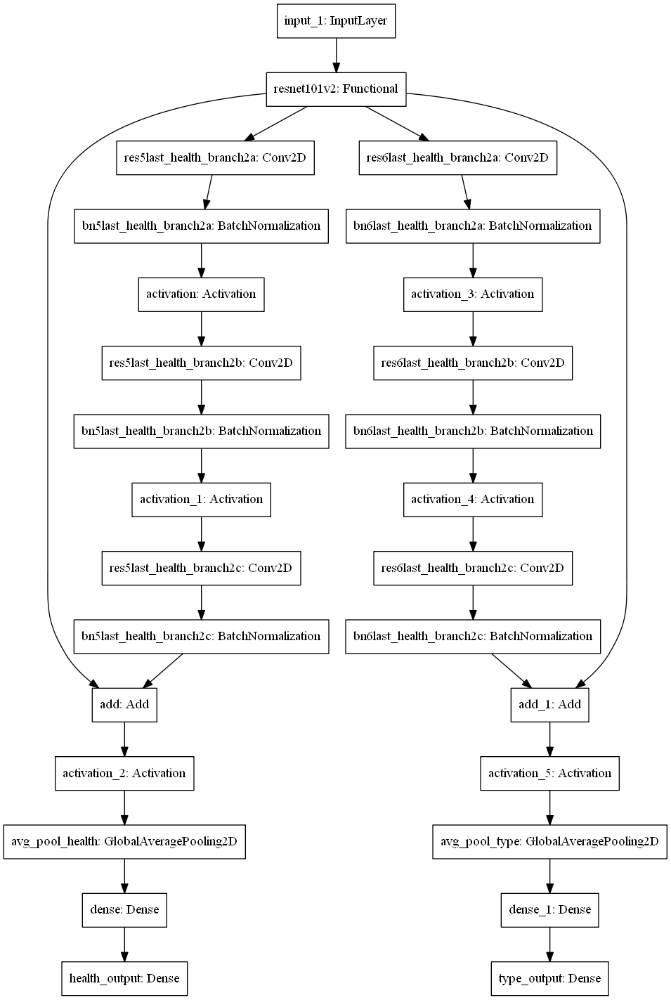

In [54]:
from tensorflow.keras.utils import plot_model
plot_model(model_r101v2_mo)

In [55]:
from tensorflow.keras import optimizers

model_r101v2_mo.compile(loss={'health_output' : 'categorical_crossentropy', 'type_output': 'categorical_crossentropy'}, 
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics={'health_output' : 'accuracy', 'type_output': 'accuracy'})

In [56]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Instanciamos nuestro objeto early_stopping
early_stopping = EarlyStopping(monitor='val_loss', min_delta=0.001, patience=10, restore_best_weights=True, verbose=1)

checkpoint = ModelCheckpoint('./labels_w/weights_resnet.{epoch:02d}-{val_loss:.2f}.h5', monitor='val_loss', verbose=0,
                             save_best_only=True, save_weights_only=False, mode='auto')

# Definimos una lista de callbacks
callbacks_list = [checkpoint]

In [68]:
spe = int(df_train.shape[0]/ 32) + 1
history_resnet101_v2_mo = model_r101v2_mo.fit(custom_generator(train_generator_mo),
                              steps_per_epoch=spe,
                              epochs=5,
                              validation_data=custom_generator(val_generator_mo),
                              validation_steps=100,
                              callbacks=callbacks_list)

Epoch 1/5
50/50 [==============================] - 19s 387ms/step - loss: 0.4800 - health_output_loss: 0.3230 - type_output_loss: 0.1570 - health_output_accuracy: 0.8906 - type_output_accuracy: 0.9531 - val_loss: 0.4375 - val_health_output_loss: 0.3143 - val_type_output_loss: 0.1233 - val_health_output_accuracy: 0.9019 - val_type_output_accuracy: 0.9624
Epoch 2/5
50/50 [==============================] - 20s 391ms/step - loss: 0.4735 - health_output_loss: 0.3198 - type_output_loss: 0.1537 - health_output_accuracy: 0.8913 - type_output_accuracy: 0.9531 - val_loss: 0.3705 - val_health_output_loss: 0.2754 - val_type_output_loss: 0.0951 - val_health_output_accuracy: 0.9056 - val_type_output_accuracy: 0.9715
Epoch 3/5
50/50 [==============================] - 20s 391ms/step - loss: 0.4973 - health_output_loss: 0.3549 - type_output_loss: 0.1424 - health_output_accuracy: 0.8800 - type_output_accuracy: 0.9544 - val_loss: 0.5057 - val_health_output_loss: 0.4036 - val_type_output_loss: 0.1021 - va

In [62]:
#model_r101v2_mo.save('./models/plans_disease_labels_resnet.h5')

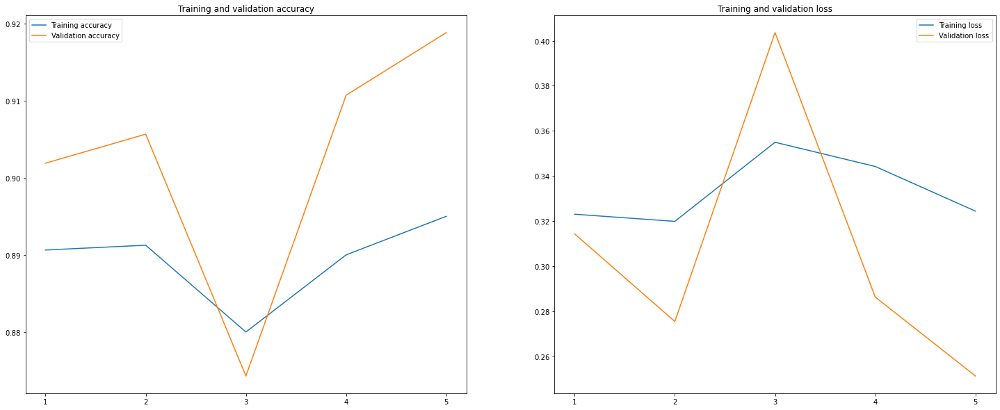

In [69]:
plotear(history_resnet101_v2_mo,'health_output_accuracy','val_health_output_accuracy','health_output_loss','val_health_output_loss')

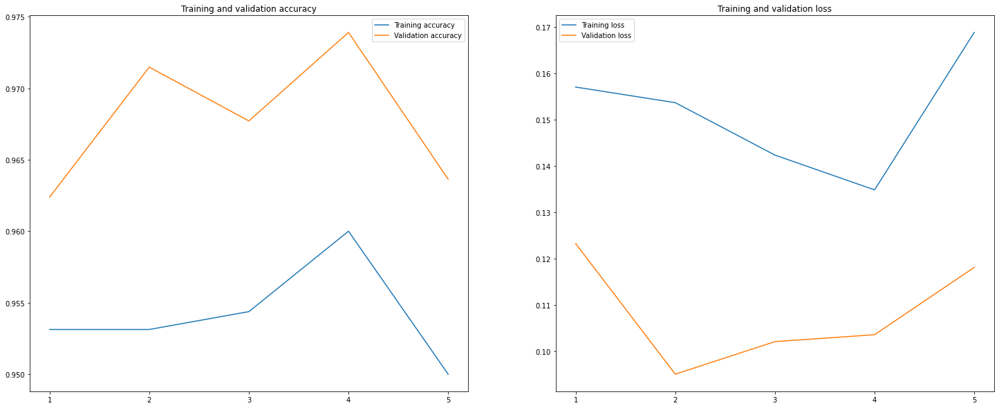

In [70]:
plotear(history_resnet101_v2_mo,'type_output_accuracy','val_type_output_accuracy','type_output_loss','val_type_output_loss')

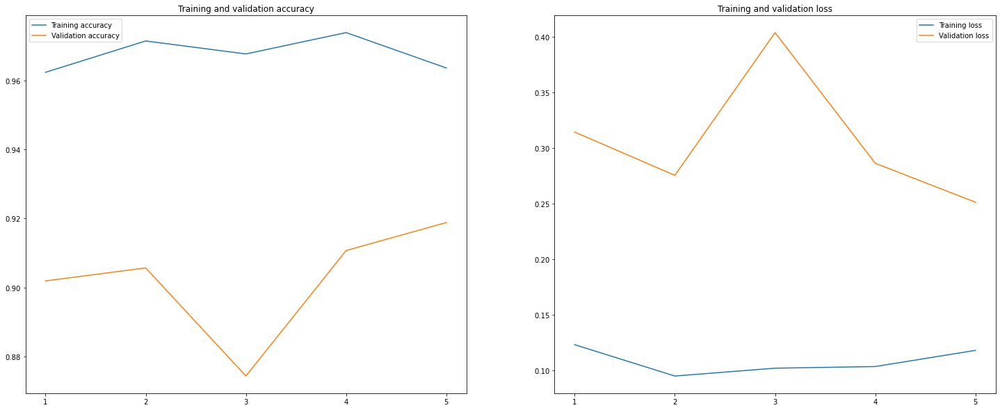

In [71]:
plotear(history_resnet101_v2_mo,'val_type_output_accuracy','val_health_output_accuracy','val_type_output_loss','val_health_output_loss')

In [72]:
# Utilizamos el Encoder para convertir el resultado de la predicción en un label
tick_labels_h = heal_encoder.categories_[0].tolist()
print(tick_labels_h[15])
tick_labels_t = type_encoder.categories_[0].tolist()
print(tick_labels_t[12])

Powdery mildew
Squash


In [73]:
from IPython.display import clear_output

In [124]:
# Generamos dos listas de predicciones para cada archivo en el set de Test
# Medimos el Accuracy de nuestro modelo
test_datagen = ImageDataGenerator(rescale=1./255)

list_test_pred_health = []
list_test_pred_type= []
preds_true = 0
for index, plant in df_test.iterrows():
  img = image.load_img(plant.file, target_size=(150, 150))

  # La convertimos a un Numpy de forma (150, 150, 3)
  x = image.img_to_array(img)

  # La reescalamos a (1, 150, 150, 3)
  x = x.reshape((1,) + x.shape)

  batch = test_datagen.flow(x, batch_size=1)
  plt.figure(i)

  #imgplot = plt.imshow(image.array_to_img(batch[0][0]))
  health_pred, type_pred = model_r101v2_mo.predict(batch[0])
  health_pred_lbl = tick_labels_h[np.argmax(health_pred)]
  type_pred_lbl = tick_labels_t[np.argmax(type_pred)]
  list_test_pred_health.append(health_pred_lbl)
  list_test_pred_type.append(type_pred_lbl)
  
  # Medimos el Accuracy de nuestro modelo
  if plant.type + plant.health == type_pred_lbl + health_pred_lbl:
    preds_true += 1
  
  clear_output(wait=True)
  print('Accuracy:',np.round(preds_true / (index + 1), 3))

Accuracy: 0.881


<Figure size 432x288 with 0 Axes>

In [125]:
# Adjuntamos las predicciones al DataFrame de Test
df_test_plot = df_test.copy(deep = True)
df_test_plot.loc[:,['healt_pred']] = list_test_pred_health
df_test_plot.loc[:,['type_pred']] = list_test_pred_type

In [126]:
# Creamos dos columnas de predicciones concatenadas para luego evaluar en que porcentaje acertó tanto en el tipo de hoja como en la salud
df_test_plot.loc[:,['concat_real']] = df_test_plot.apply(lambda x: x.type + '__' + x.health, axis=1)
df_test_plot.loc[:,['concat_pred']] = df_test_plot.apply(lambda x: x.type_pred + '__' + x.healt_pred, axis=1)

Confusion Matrix


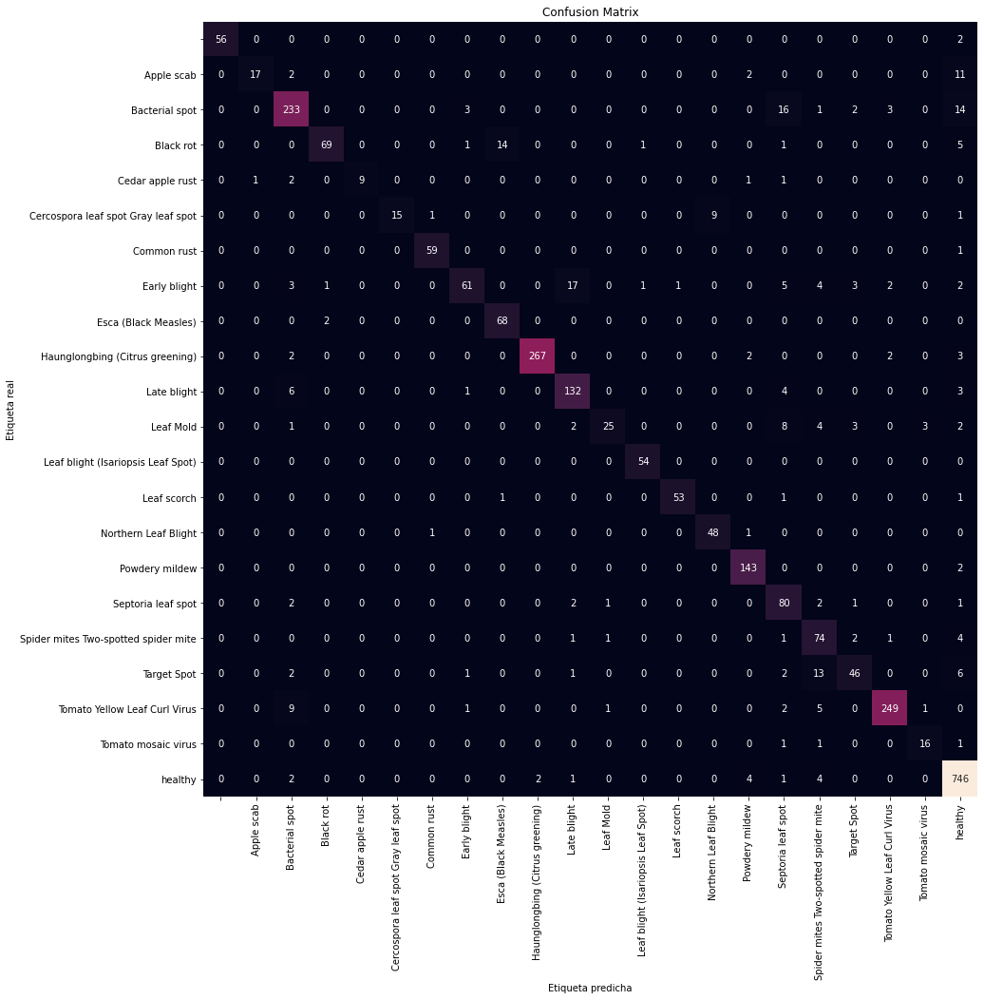

In [127]:
# Matriz de Confusión de Health
print('Confusion Matrix')
cm = confusion_matrix(df_test_plot.health, df_test_plot.healt_pred)

plt.figure(figsize=(15,15))
sns.heatmap(cm, annot=True, fmt='.0f', square=True,
             xticklabels=tick_labels_h, yticklabels=tick_labels_h,
             cbar=False)
plt.ylabel('Etiqueta real')
plt.xlabel('Etiqueta predicha')
plt.title('Confusion Matrix')
plt.show()

Confusion Matrix


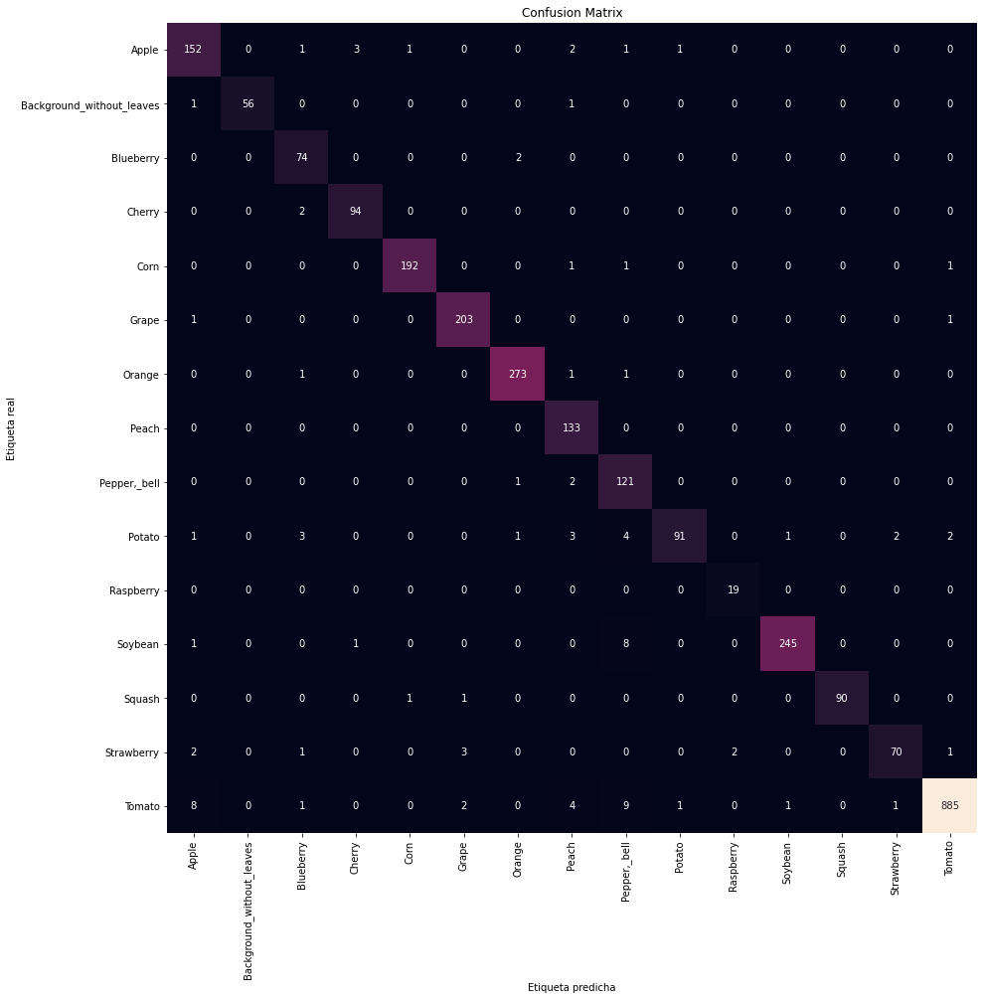

In [128]:
# Matriz de Confusión de Type
print('Confusion Matrix')
cm = confusion_matrix(df_test_plot.type, df_test_plot.type_pred)

plt.figure(figsize=(15,15))
sns.heatmap(cm, annot=True, fmt='.0f', square=True,
             xticklabels=tick_labels_t, yticklabels=tick_labels_t,
             cbar=False)
plt.ylabel('Etiqueta real')
plt.xlabel('Etiqueta predicha')
plt.title('Confusion Matrix')
plt.show()

Confusion Matrix


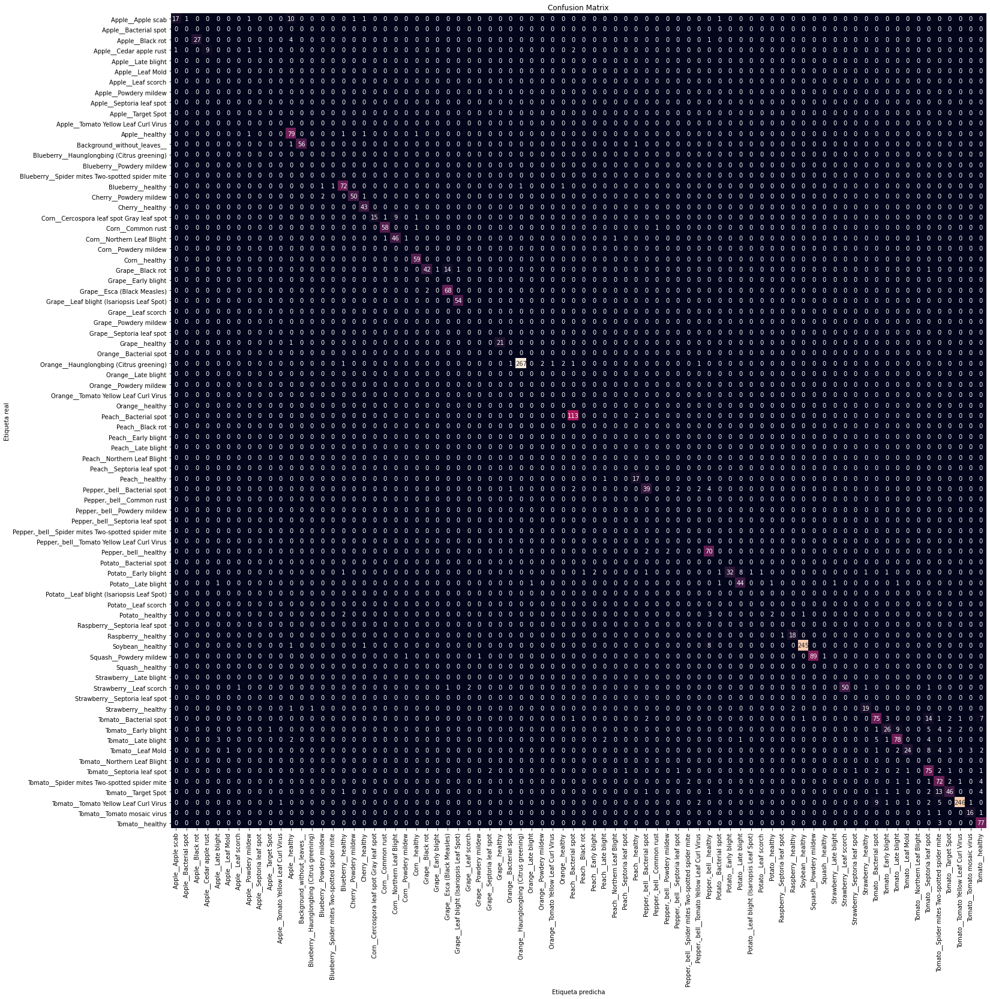

In [129]:
# Matriz de Confusión de las categorías concatenadas
print('Confusion Matrix')
cm = confusion_matrix(df_test_plot.concat_real, df_test_plot.concat_pred)

lbl_concat_preds = np.sort(df_test_plot.concat_pred.unique())

plt.figure(figsize=(25,25))
sns.heatmap(cm, annot=True, fmt='.0f', square=True,
             xticklabels=lbl_concat_preds, yticklabels=lbl_concat_preds,
             cbar=False)
plt.ylabel('Etiqueta real')
plt.xlabel('Etiqueta predicha')
plt.title('Confusion Matrix')
plt.show()

In [130]:
# Classification report
print('\nClassification Report:\n')
print(classification_report(df_test_plot.concat_real.to_numpy().flatten(), df_test_plot.concat_pred.to_numpy().flatten(), target_names=lbl_concat_preds, digits = 2))


Classification Report:

                                                    precision    recall  f1-score   support

                                 Apple__Apple scab       0.94      0.53      0.68        32
                             Apple__Bacterial spot       0.00      0.00      0.00         0
                                  Apple__Black rot       1.00      0.84      0.92        32
                           Apple__Cedar apple rust       1.00      0.64      0.78        14
                                Apple__Late blight       0.00      0.00      0.00         0
                                  Apple__Leaf Mold       0.00      0.00      0.00         0
                                Apple__Leaf scorch       0.00      0.00      0.00         0
                             Apple__Powdery mildew       0.00      0.00      0.00         0
                         Apple__Septoria leaf spot       0.00      0.00      0.00         0
                                Apple__Target Spot    

C:\Users\alexi\.conda\envs\tf\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [132]:
# Obtenemos las predicciones equivocadas 
bad_pred_mask = df_test_plot.concat_real !=  df_test_plot.concat_pred
bad_pred_mask.sum()

333

Real: Apple-Apple scab | predicted: Apple-healthy


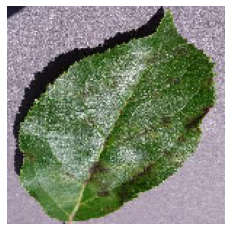

Example prediction:
Apple-healthy


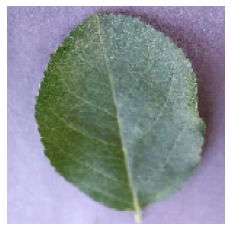

###### 


Real: Apple-Apple scab | predicted: Apple-healthy


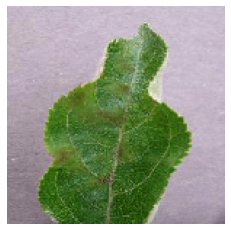

Example prediction:
Apple-healthy


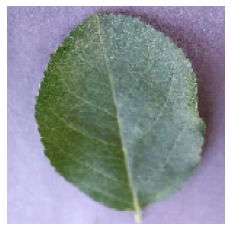

###### 


Real: Apple-Apple scab | predicted: Apple-healthy


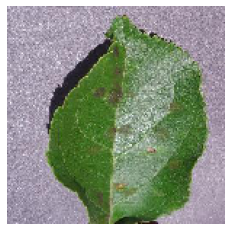

Example prediction:
Apple-healthy


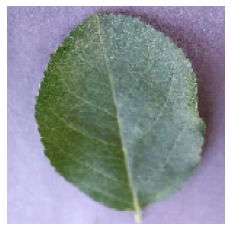

###### 


Real: Apple-Apple scab | predicted: Apple-healthy


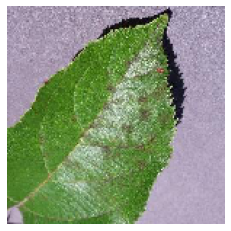

Example prediction:
Apple-healthy


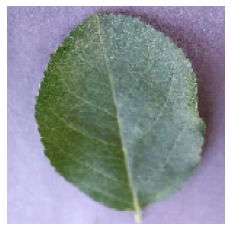

###### 


Real: Apple-Apple scab | predicted: Apple-healthy


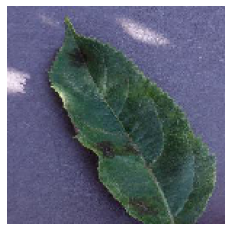

Example prediction:
Apple-healthy


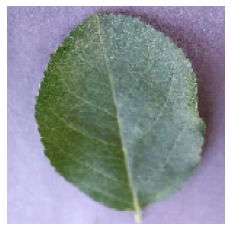

###### 


Real: Apple-Apple scab | predicted: Apple-healthy


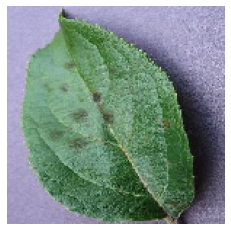

Example prediction:
Apple-healthy


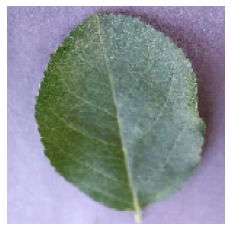

###### 


Real: Apple-Apple scab | predicted: Apple-healthy


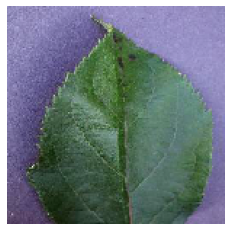

Example prediction:
Apple-healthy


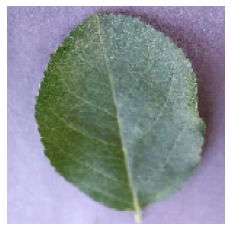

###### 


Real: Apple-Apple scab | predicted: Apple-healthy


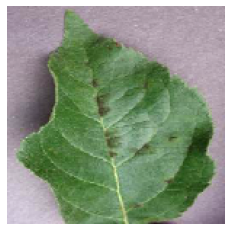

Example prediction:
Apple-healthy


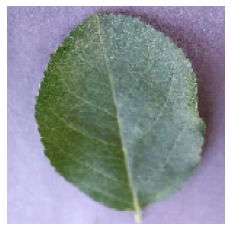

###### 


Real: Apple-Apple scab | predicted: Apple-healthy


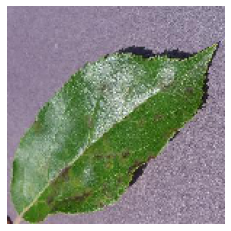

Example prediction:
Apple-healthy


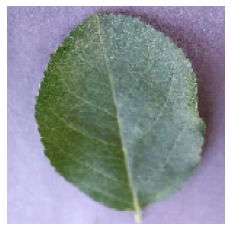

###### 


Real: Apple-Apple scab | predicted: Cherry-healthy


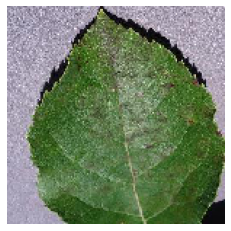

Example prediction:
Cherry-healthy


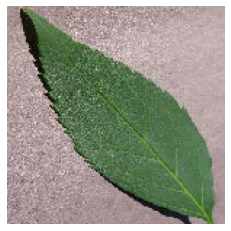

###### 




In [135]:
# Iteramos y obtenemos las hoja reales vs una muestra de la prediccion
# Para visualizar los errores del modelo 
i = 0
for index, plant in df_test_plot[bad_pred_mask].iterrows():

  img = image.load_img(plant.file, target_size=(150, 150))

  # La convertimos a un Numpy de forma (150, 150, 3)
  x = image.img_to_array(img)

  # La reescalamos a (1, 150, 150, 3)
  x = x.reshape((1,) + x.shape)

  batch = test_datagen.flow(x, batch_size=1) 

  type_mask = df_train.type == plant.type_pred 
  health_mask = df_train.health == plant.healt_pred
  example_pred = df_train[type_mask & health_mask].file

  # Si existe la combinacion entre hoja y estado de salud, imprimimos ambas imagenes
  if (example_pred.shape[0] > 0):
    print("Real: " + plant.type + "-" + plant.health + " | predicted: " + plant.type_pred + "-" + plant.healt_pred)
    plt.figure(i)
    imgplot = plt.imshow(image.array_to_img(batch[0][0]))
    plt.axis('off')
    plt.show()  
    print("Example prediction:")
    y_img = image.load_img(example_pred.iloc[0], target_size=(150, 150))
    y = image.img_to_array(y_img)
    y = y.reshape((1,) + y.shape)
    print(plant.type_pred + "-" + plant.healt_pred)
    Y_batch = test_datagen.flow(y, batch_size=1)
    Y_imgplot = plt.imshow(image.array_to_img(Y_batch[0][0]))
    plt.axis('off')
    plt.show()  
    print('######','\n\n')
  i += 1
  if i % 13 == 0:
      break

In [136]:
type_mask = df_test_plot.type == 'Apple'
health_mask = df_test_plot.health == 'healthy'
example_pred = df_test_plot[type_mask & health_mask].file

In [137]:
example_pred.iloc[0]

'd:/Datasets/PlantLeaf/testing/Apple___healthy/image (1042).JPG'

## Modelo Custom CNN Doble Output (Early Split)

In [94]:
# Importamos las clases Model e Input del módulo de modelos y capas, respectivamente
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, GlobalAveragePooling2D


health_utput_units =  df_train.health.value_counts().shape[0]
type_utput_units =  df_train.type.value_counts().shape[0]

# Definimos una variable que será una instancia de la clase Input
# donde especificamos las dimensiones de los datos de entrada
input_layer = Input(shape=(150, 150, 3))
# Definimos una variable distinta para cada capa del modelo
x = Conv2D(32, (3, 3), activation='relu')(input_layer)
x = MaxPooling2D((2, 2))(x)

########## HEALTH LAYERS
x_health = Conv2D(64, (3, 3), activation='relu')(x)
x_health = MaxPooling2D((2, 2))(x_health)

x_health = Conv2D(128, (3, 3), activation='relu')(x_health)
x_health = MaxPooling2D((2, 2))(x_health)

x_health = Conv2D(128, (3, 3), activation='relu')(x_health)
x_health = MaxPooling2D((2, 2))(x_health)

x_health = GlobalAveragePooling2D(name='avg_pool_health')(x_health)
x_health = Dense(512, activation='relu')(x_health)
health_output_layer = Dense(health_utput_units, activation='softmax', name='health_output')(x_health)
##########
########## TYPE LAYERS
x_type = Conv2D(64, (3, 3), activation='relu')(x)
x_type = MaxPooling2D((2, 2))(x_type)

x_type = Conv2D(128, (3, 3), activation='relu')(x_type)
x_type = MaxPooling2D((2, 2))(x_type)

x_type = Conv2D(128, (3, 3), activation='relu')(x_type)
x_type = MaxPooling2D((2, 2))(x_type)

x_type = GlobalAveragePooling2D(name='avg_pool_type')(x_type)
x_type = Dense(512, activation='relu')(x_type)
x_type_output_layer = Dense(type_utput_units, activation='softmax', name='type_output')(x_type)
##########

# Creamos la instancia del modelo multi-input
# Al haber múltiples entradas, definimos una lista de inputs
CustomCNN_2O = Model(input_layer, [health_output_layer,x_type_output_layer] ,name='CustomCNN_2Out')

In [95]:
# Vemos que el summary del modelo es exactamente el mismo
# salvo que ahora se especifica la InputLayer, antes omitida
CustomCNN_2O.summary()

Model: "CustomCNN_2Out"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 150, 150, 3) 0                                            
__________________________________________________________________________________________________
conv2d_14 (Conv2D)              (None, 148, 148, 32) 896         input_5[0][0]                    
__________________________________________________________________________________________________
max_pooling2d_17 (MaxPooling2D) (None, 74, 74, 32)   0           conv2d_14[0][0]                  
__________________________________________________________________________________________________
conv2d_15 (Conv2D)              (None, 72, 72, 64)   18496       max_pooling2d_17[0][0]           
_____________________________________________________________________________________

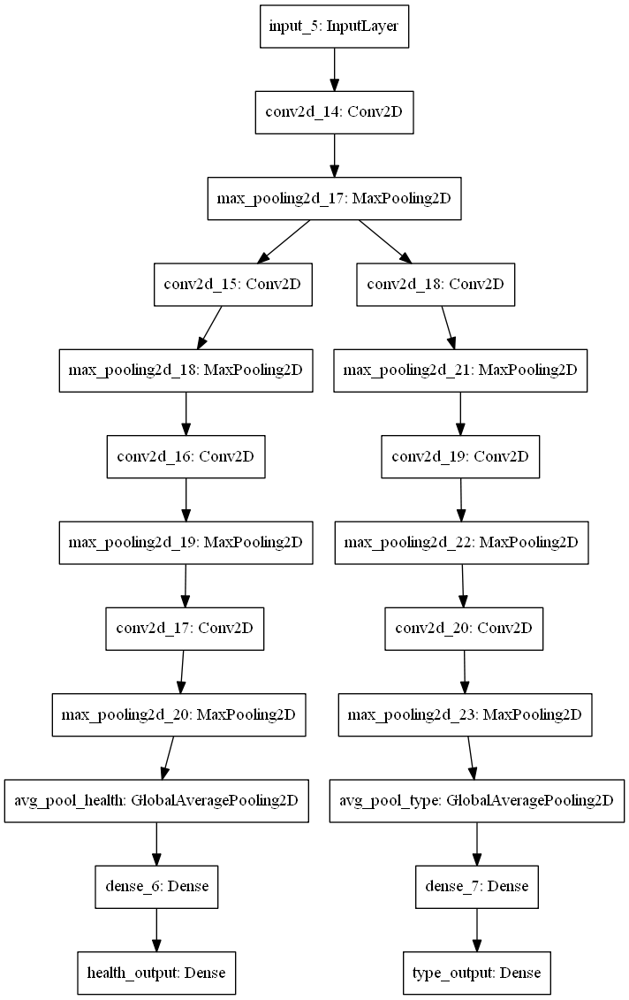

In [96]:
plot_model(CustomCNN_2O)

In [97]:
CustomCNN_2O.compile(loss={'health_output' : 'categorical_crossentropy', 'type_output': 'categorical_crossentropy'}, 
              # loss_weights={'health_output' : 1, 'type_output': 1},
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics={'health_output' : 'accuracy', 'type_output': 'accuracy'})

In [98]:
custom_callbacks = [define_callbacks(CustomCNN_2O.name)]

Model Callbacks on Model CustomCNN_2Out, are the following:
····················································
EarlyStoppingCallback: Monitor: val_loss, Verbose: 1, Patience: 8, MinDelta: -0.01, RestoreWeights: True
ModelCheckpoint: Monitor: val_loss, Verbose: 1, SaveBestOnly: True
TensorBoard: Log Dir: logs/fit/CustomCNN_2Out20201201-190340, histogram_freq: 1


In [100]:
spe = 42000 / 20
history = CustomCNN_2O.fit_generator(custom_generator(train_generator_mo),
                              steps_per_epoch=spe,
                              epochs=10,
                              validation_data=custom_generator(val_generator_mo),
                              validation_steps=100,
                              callbacks=callbacks_list)

Instructions for updating:
Please use Model.fit, which supports generators.
Epoch 1/10
50/50 [==============================] - 13s 259ms/step - loss: 5.1405 - health_output_loss: 2.7351 - type_output_loss: 2.4054 - health_output_accuracy: 0.2511 - type_output_accuracy: 0.3275 - val_loss: 5.0128 - val_health_output_loss: 2.6288 - val_type_output_loss: 2.3840 - val_health_output_accuracy: 0.2433 - val_type_output_accuracy: 0.2850
Epoch 2/10
50/50 [==============================] - 12s 247ms/step - loss: 4.9078 - health_output_loss: 2.5304 - type_output_loss: 2.3774 - health_output_accuracy: 0.2887 - type_output_accuracy: 0.3119 - val_loss: 4.8958 - val_health_output_loss: 2.4699 - val_type_output_loss: 2.4259 - val_health_output_accuracy: 0.2956 - val_type_output_accuracy: 0.2850
Epoch 3/10
50/50 [==============================] - 12s 244ms/step - loss: 4.7789 - health_output_loss: 2.4872 - type_output_loss: 2.2916 - health_output_accuracy: 0.3325 - type_output_accuracy: 0.3281 - val_lo

In [ ]:
CustomCNN_2O.save('drive/My Drive/plans_disease_1.h5')

In [105]:
# Generamos dos listas de predicciones para cada archivo en el set de Test
# Medimos el Accuracy de nuestro modelo
test_datagen = ImageDataGenerator(rescale=1./255)

list_test_pred_health = []
list_test_pred_type= []
preds_true = 0
for index, plant in df_test.iterrows():
  img = image.load_img(plant.file, target_size=(150, 150))

  # La convertimos a un Numpy de forma (150, 150, 3)
  x = image.img_to_array(img)

  # La reescalamos a (1, 150, 150, 3)
  x = x.reshape((1,) + x.shape)

  batch = test_datagen.flow(x, batch_size=1)
  plt.figure(i)

  #imgplot = plt.imshow(image.array_to_img(batch[0][0]))
  health_pred, type_pred = CustomCNN_2O.predict(batch[0])
  health_pred_lbl = tick_labels_h[np.argmax(health_pred)]
  type_pred_lbl = tick_labels_t[np.argmax(type_pred)]
  list_test_pred_health.append(health_pred_lbl)
  list_test_pred_type.append(type_pred_lbl)
  
  # Medimos el Accuracy de nuestro modelo
  if plant.type + plant.health == type_pred_lbl + health_pred_lbl:
    preds_true += 1
  
  clear_output(wait=True)
  print('Accuracy:',np.round(preds_true / (index + 1), 3))

Accuracy: 0.168


<Figure size 432x288 with 0 Axes>

In [108]:
# Adjuntamos las predicciones al DataFrame de Test
df_test.loc[:,['healt_pred']] = list_test_pred_health
df_test.loc[:,['type_pred']] = list_test_pred_type

In [109]:
# Creamos dos columnas de predicciones concatenadas para luego evaluar en que porcentaje acertó tanto en el tipo de hoja como en la salud
df_test.loc[:,['concat_real']] = df_test.apply(lambda x: x.type + '__' + x.health, axis=1)
df_test.loc[:,['concat_pred']] = df_test.apply(lambda x: x.type_pred + '__' + x.healt_pred, axis=1)

Confusion Matrix


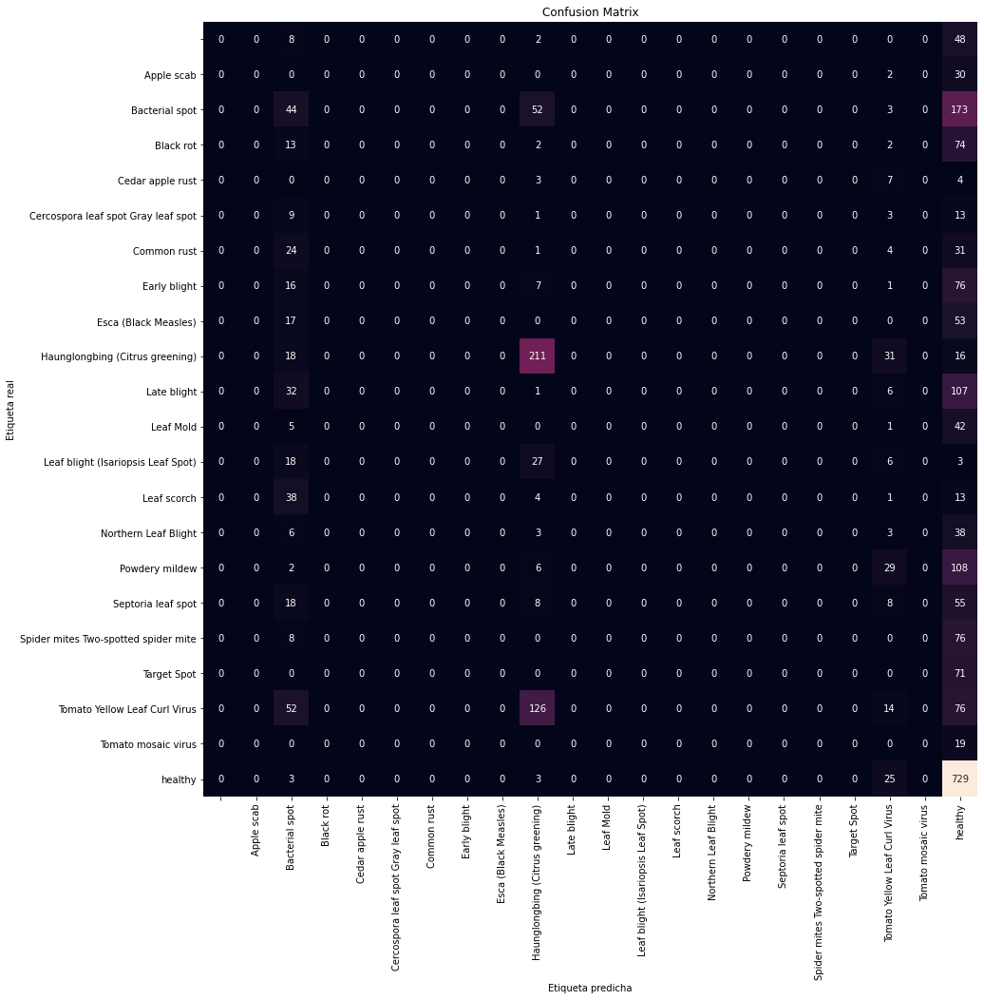

In [110]:
# Matriz de Confusión de Health
print('Confusion Matrix')
cm = confusion_matrix(df_test.health, df_test.healt_pred)

plt.figure(figsize=(15,15))
sns.heatmap(cm, annot=True, fmt='.0f', square=True,
             xticklabels=tick_labels_h, yticklabels=tick_labels_h,
             cbar=False)
plt.ylabel('Etiqueta real')
plt.xlabel('Etiqueta predicha')
plt.title('Confusion Matrix')
plt.show()

Confusion Matrix


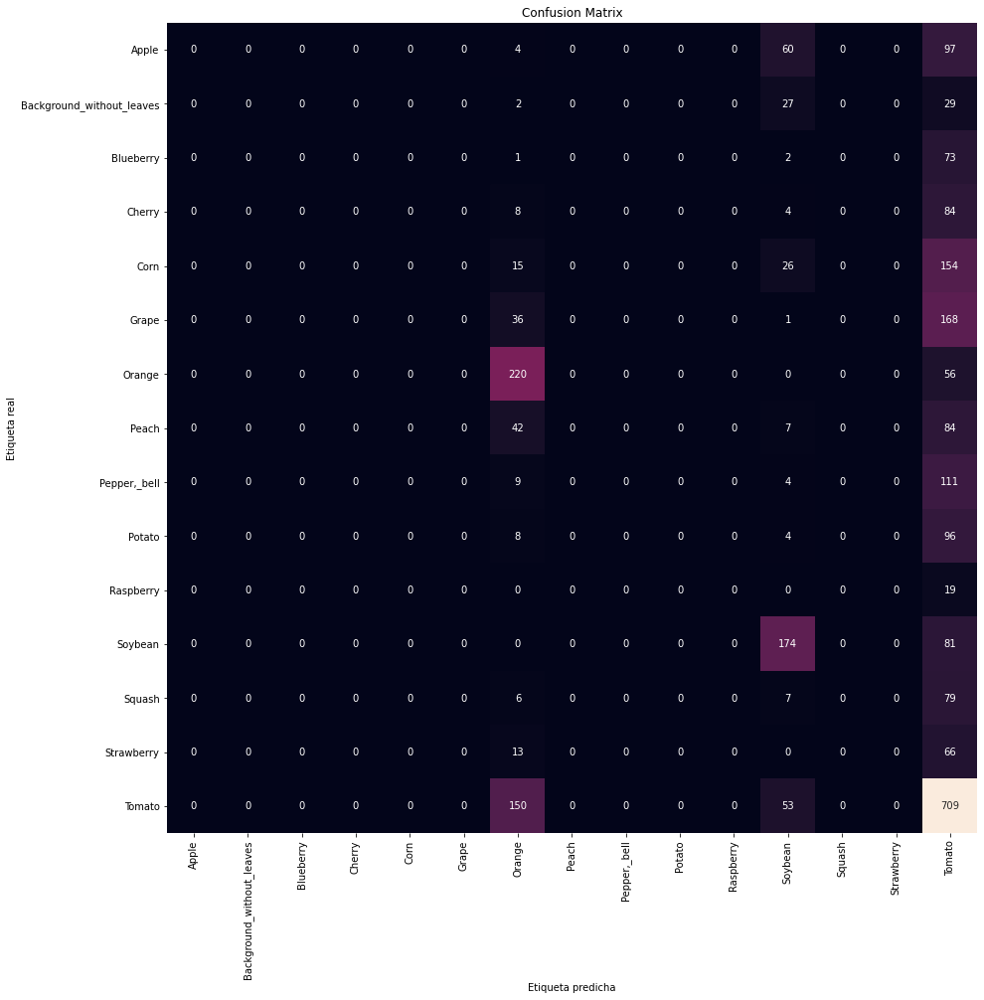

In [111]:
# Matriz de Confusión de Type
print('Confusion Matrix')
cm = confusion_matrix(df_test.type, df_test.type_pred)

plt.figure(figsize=(15,15))
sns.heatmap(cm, annot=True, fmt='.0f', square=True,
             xticklabels=tick_labels_t, yticklabels=tick_labels_t,
             cbar=False)
plt.ylabel('Etiqueta real')
plt.xlabel('Etiqueta predicha')
plt.title('Confusion Matrix')
plt.show()

Confusion Matrix


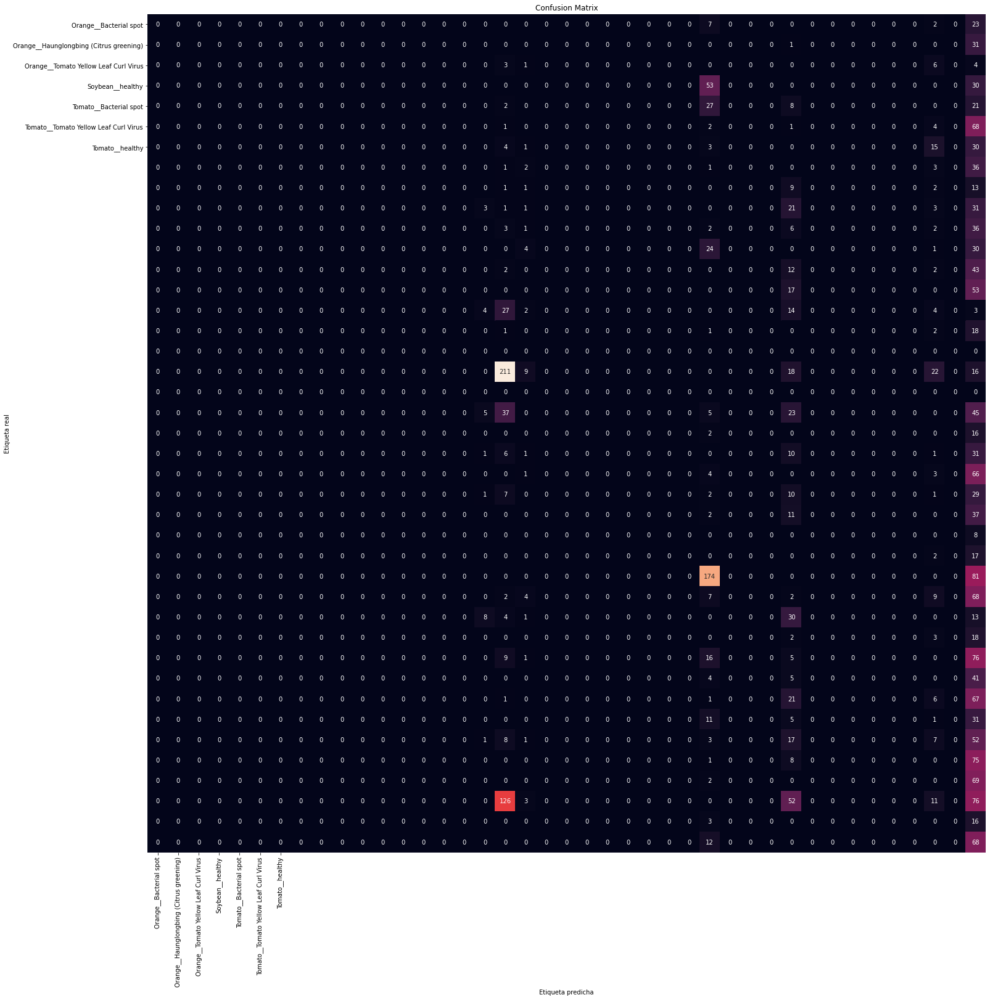

In [112]:
# Matriz de Confusión de las categorías concatenadas
print('Confusion Matrix')
cm = confusion_matrix(df_test.concat_real, df_test.concat_pred)

lbl_concat_preds = np.sort(df_test.concat_pred.unique())

plt.figure(figsize=(25,25))
sns.heatmap(cm, annot=True, fmt='.0f', square=True,
             xticklabels=lbl_concat_preds, yticklabels=lbl_concat_preds,
             cbar=False)
plt.ylabel('Etiqueta real')
plt.xlabel('Etiqueta predicha')
plt.title('Confusion Matrix')
plt.show()

## Modelo Custom CNN Doble Output (Late Split)

In [114]:
# Importamos las clases Model e Input del módulo de modelos y capas, respectivamente
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, GlobalAveragePooling2D


health_utput_units =  df_train.health.value_counts().shape[0]
type_utput_units =  df_train.type.value_counts().shape[0]

# Definimos una variable que será una instancia de la clase Input
# donde especificamos las dimensiones de los datos de entrada
input_layer = Input(shape=(150, 150, 3))
# Definimos una variable distinta para cada capa del modelo
x = Conv2D(32, (3, 3), activation='relu')(input_layer)
x = MaxPooling2D((2, 2))(x)

x = Conv2D(64, (3, 3), activation='relu')(x)
x = MaxPooling2D((2, 2))(x)

########## HEALTH LAYERS

x_health = Conv2D(128, (3, 3), activation='relu')(x)
x_health = MaxPooling2D((2, 2))(x_health)

x_health = Conv2D(128, (3, 3), activation='relu')(x_health)
x_health = MaxPooling2D((2, 2))(x_health)

x_health = GlobalAveragePooling2D(name='avg_pool_health')(x_health)
x_health = Dense(512, activation='relu')(x_health)
health_output_layer = Dense(health_utput_units, activation='softmax', name='health_output')(x_health)

########## TYPE LAYERS

x_type = Conv2D(128, (3, 3), activation='relu')(x)
x_type = MaxPooling2D((2, 2))(x_type)

x_type = Conv2D(128, (3, 3), activation='relu')(x_type)
x_type = MaxPooling2D((2, 2))(x_type)

x_type = GlobalAveragePooling2D(name='avg_pool_type')(x_type)
x_type = Dense(512, activation='relu')(x_type)
x_type_output_layer = Dense(type_utput_units, activation='softmax', name='type_output')(x_type)

##########

# Creamos la instancia del modelo multi-input
# Al haber múltiples entradas, definimos una lista de inputs
CustomCNN_2O_LateSplit = Model(input_layer, [health_output_layer,x_type_output_layer])

In [115]:
# Vemos que el summary del modelo es exactamente el mismo
# salvo que ahora se especifica la InputLayer, antes omitida
CustomCNN_2O_LateSplit.summary()

Model: "functional_7"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            [(None, 150, 150, 3) 0                                            
__________________________________________________________________________________________________
conv2d_21 (Conv2D)              (None, 148, 148, 32) 896         input_6[0][0]                    
__________________________________________________________________________________________________
max_pooling2d_24 (MaxPooling2D) (None, 74, 74, 32)   0           conv2d_21[0][0]                  
__________________________________________________________________________________________________
conv2d_22 (Conv2D)              (None, 72, 72, 64)   18496       max_pooling2d_24[0][0]           
_______________________________________________________________________________________

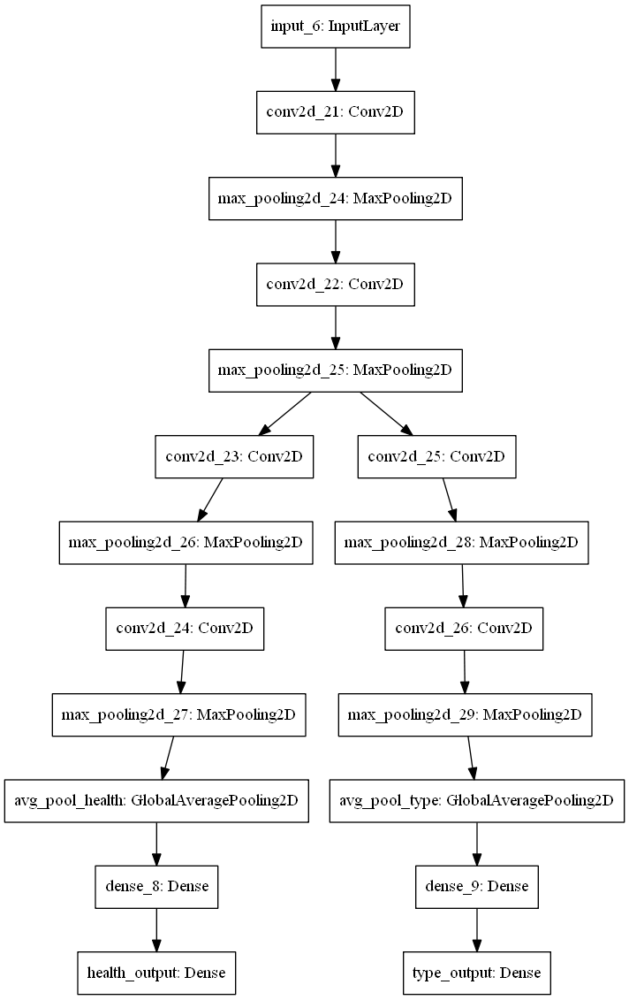

In [116]:
plot_model(CustomCNN_2O_LateSplit)

In [117]:
CustomCNN_2O_LateSplit.compile(loss={'health_output' : 'categorical_crossentropy', 'type_output': 'categorical_crossentropy'}, 
              # loss_weights={'health_output' : 1, 'type_output': 1},
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics={'health_output' : 'accuracy', 'type_output': 'accuracy'})

In [119]:
custom_callbacks = [define_callbacks(CustomCNN_2O_LateSplit.name)]

Model Callbacks on Model functional_7, are the following:
····················································
EarlyStoppingCallback: Monitor: val_loss, Verbose: 1, Patience: 8, MinDelta: -0.01, RestoreWeights: True
ModelCheckpoint: Monitor: val_loss, Verbose: 1, SaveBestOnly: True
TensorBoard: Log Dir: logs/fit/functional_720201201-200822, histogram_freq: 1


In [120]:
spe = 42000 / 20
history_CustomCNN_2O_LateSplit = CustomCNN_2O_LateSplit.fit_generator(custom_generator(train_generator_mo),
                              steps_per_epoch=spe,
                              epochs=10,
                              validation_data=custom_generator(val_generator_mo),
                              validation_steps=100,
                              callbacks=callbacks_list)

Epoch 1/10
50/50 [==============================] - 38s 756ms/step - loss: 5.1294 - health_output_loss: 2.6908 - type_output_loss: 2.4387 - health_output_accuracy: 0.2819 - type_output_accuracy: 0.3125 - val_loss: 4.8988 - val_health_output_loss: 2.6674 - val_type_output_loss: 2.2314 - val_health_output_accuracy: 0.2367 - val_type_output_accuracy: 0.4154
Epoch 2/10
50/50 [==============================] - 22s 432ms/step - loss: 5.0044 - health_output_loss: 2.6503 - type_output_loss: 2.3541 - health_output_accuracy: 0.2500 - type_output_accuracy: 0.3300 - val_loss: 5.0445 - val_health_output_loss: 2.5611 - val_type_output_loss: 2.4834 - val_health_output_accuracy: 0.3003 - val_type_output_accuracy: 0.2928
Epoch 3/10
50/50 [==============================] - 22s 434ms/step - loss: 4.8953 - health_output_loss: 2.5743 - type_output_loss: 2.3210 - health_output_accuracy: 0.2756 - type_output_accuracy: 0.3388 - val_loss: 4.9585 - val_health_output_loss: 2.6031 - val_type_output_loss: 2.3554 -

In [121]:
CustomCNN_2O_LateSplit.save('./models/plant_decease_CustomCNN_2O_LateSplit.h5')